In [15]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('paper')

In [16]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error

In [17]:
from statsmodels.tools.eval_measures import rmse

In [18]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
sns.set_context('talk')
sns.set_style('white')

In [20]:
plt.rcParams["figure.dpi"] = 300

In [21]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
psizes = [150,120,200,120,350]
pmarkers = ['o', 's', '^', 'D', '*']

# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['P', 'X', 'h', '<','>']
apallete = ['#6dad36', '#c7e89f', '#f5c4e1', '#d5579d', '#8a0850']

aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']

In [22]:
mpalette = sns.color_palette('Accent', n_colors=8).as_hex()
#mpalette = [mpalette[0]] + mpalette[4:7]

AXENIC_COLOR = '#47B07B' # axenic (green ) 
COCULTURE = '#7D7D7D' # co-culture (grey) #7D7D7D
CC_COLOR = '#1B73D3'
#9479b9

mpalette = ['#7fc97f', '#ff3333', '#fc9636',  '#386cb0']
sns.color_palette(mpalette)

[(0.4980392156862745, 0.788235294117647, 0.4980392156862745),
 (1.0, 0.2, 0.2),
 (0.9882352941176471, 0.5882352941176471, 0.21176470588235294),
 (0.2196078431372549, 0.4235294117647059, 0.6901960784313725)]

In [23]:
PRO_COLOR = 'MediumSeaGreen'
ALT_COLOR = 'Gold'

In [24]:
declinedf = pd.read_csv('declinemodels.csv.gz')

In [25]:
df = declinedf

In [26]:
df.head()

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,f,a1,a2,weibull_n,weibull_a,weibull_td,weibull_td2,p,PRO2,PA
0,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,0.863408,0.374863,0.008879,0.259722,0.896868,37.725443,544.100668,MIT0604,MIT0604,"MIT0604,DE"
1,1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.142509,0.5,0.5,...,0.843629,0.380370,0.009144,0.264545,0.838354,45.567042,625.988060,MIT0604,MIT0604,"MIT0604,DE"
2,2,"e1, 10C",e1,10C,MIT0604,DE,Co_Culture,0.164214,0.5,0.5,...,0.869769,0.365484,0.008610,0.235531,1.007286,33.456743,634.710276,MIT0604,MIT0604,"MIT0604,DE"
3,3,"e1, 11A",e1,11A,MED4,DE1,Co_Culture,0.101841,1.0,1.0,...,0.824206,0.170692,0.021516,0.549802,0.342589,31.987654,112.851280,MED4,MED4,"MED4,DE1"
4,4,"e1, 11B",e1,11B,MED4,DE1,Co_Culture,0.125338,1.0,1.0,...,0.500000,0.125335,0.125335,0.458725,0.503584,27.484170,124.541516,MED4,MED4,"MED4,DE1"


In [27]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [28]:
df.groupby(['experiment', 'culture']).agg(['count','mean', 'std'])[[
    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
]].T

experiment                        e1                      e3          e4  \
culture                       Axenic  Co_Culture  Co_Culture  Co_Culture   
rmse_exponential   count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.257939    0.512270    0.238323    0.209767   
                   std      0.110183    0.299797    0.136174    0.104714   
rmse_biexponential count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.257944    0.267752    0.125199    0.129114   
                   std      0.110184    0.167661    0.056302    0.071875   
rmse_harmonic      count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.504903    0.322772    0.160484    0.153519   
                   std      0.188740    0.199101    0.086341    0.076091   
rmse_weibull       count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.142497    0.292344    0.147892    0.161364   
                   std      0.079291    0.129976    0.075244    0.089434   
bic_exponential    count   13.000000   73.000000   69.000000   72.000000   
                   mean  -230.842315 -116.359101 -221.070179 -231.150179   
                   std     80.398674   81.632149   87.124433   78.061850   
bic_biexponential  count   13.000000   73.000000   69.000000   72.000000   
                   mean  -222.056243 -207.639627 -296.087047 -296.103532   
                   std     80.384243   78.659683   76.530588   91.810304   
bic_harmonic       count   13.000000   73.000000   69.000000   72.000000   
                   mean  -121.505517 -186.899389 -275.109960 -274.350057   
                   std     80.806579   77.394776   86.612289   78.578585   
bic_weibull        count   13.000000   73.000000   69.000000   72.000000   
                   mean  -331.334154 -187.770723 -278.853433 -268.421384   
                   std     96.638874   56.640941   79.121584   89.940236   

experiment                        e5          e6  
culture                   Co_Culture  Co_Culture  
rmse_exponential   count   64.000000   65.000000  
                   mean     0.232824    0.220660  
                   std      0.136349    0.121210  
rmse_biexponential count   64.000000   65.000000  
                   mean     0.143662    0.118739  
                   std      0.094094    0.086501  
rmse_harmonic      count   64.000000   65.000000  
                   mean     0.169944    0.137803  
                   std      0.085856    0.072410  
rmse_weibull       count   64.000000   65.000000  
                   mean     0.158891    0.128740  
                   std      0.081278    0.065385  
bic_exponential    count   64.000000   65.000000  
                   mean  -141.561773 -117.106808  
                   std     64.805865   44.765330  
bic_biexponential  count   64.000000   65.000000  
                   mean  -175.905745 -157.125187  
                   std     64.779722   49.721600  
bic_harmonic       count   64.000000   65.000000  
                   mean  -166.253303 -150.971363  
                   std     63.577499   48.025676  
bic_weibull        count   64.000000   65.000000  
                   mean  -166.573018 -150.889198  
                   std     58.138718   44.544453

In [29]:
df.groupby([#'experiment',
            'culture']).agg(['mean', 'std'])[[
    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
]].T

culture                      Axenic  Co_Culture
rmse_exponential   mean    0.257939    0.286259
                   std     0.110183    0.212156
rmse_biexponential mean    0.257944    0.158581
                   std     0.110184    0.118097
rmse_harmonic      mean    0.504903    0.191028
                   std     0.188740    0.134831
rmse_weibull       mean    0.142497    0.179886
                   std     0.079291    0.109168
bic_exponential    mean -230.842315 -166.363748
                   std    80.398674   89.012842
bic_biexponential  mean -222.056243 -228.508041
                   std    80.384243   94.420507
bic_harmonic       mean -121.505517 -212.340515
                   std    80.806579   89.813899
bic_weibull        mean -331.334154 -212.078601
                   std    96.638874   85.945328

In [30]:
df.groupby(['experiment', 'culture']).agg(['mean', 'std'])[[
    'weibull_n', 
    
    
]].T

experiment            e1                    e3         e4         e5  \
culture           Axenic Co_Culture Co_Culture Co_Culture Co_Culture   
weibull_n mean  2.104315   0.432316   0.476672   0.481650   0.645032   
          std   0.879080   0.170985   0.321106   0.403341   0.336848   

experiment             e6  
culture        Co_Culture  
weibull_n mean   0.532147  
          std    0.160253

In [31]:
declinedf.groupby(['experiment', 'culture']).agg(['mean', 'median', 'std'])[[
    'weibull_td2', 
    
    
]].T

experiment                 e1                         e3            e4  \
culture                Axenic    Co_Culture   Co_Culture    Co_Culture   
weibull_td2 mean    12.575946  3.420668e+06   840.938529  8.067992e+29   
            median  12.793370  2.362524e+02   350.342904  2.695843e+02   
            std      3.845505  2.876089e+07  2541.998392  6.845918e+30   

experiment                  e5          e6  
culture             Co_Culture  Co_Culture  
weibull_td2 mean    156.450905  180.368051  
            median  120.673731  169.247341  
            std     112.297263  112.623949

In [32]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [33]:
mdf = df.melt(
    id_vars=['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'p', 'PRO2', 'PA'],
    value_vars=[    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
                'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td',
               ]
)

In [34]:
mdf[['metric', 'model']] = mdf.variable.str.split('_', expand=True)

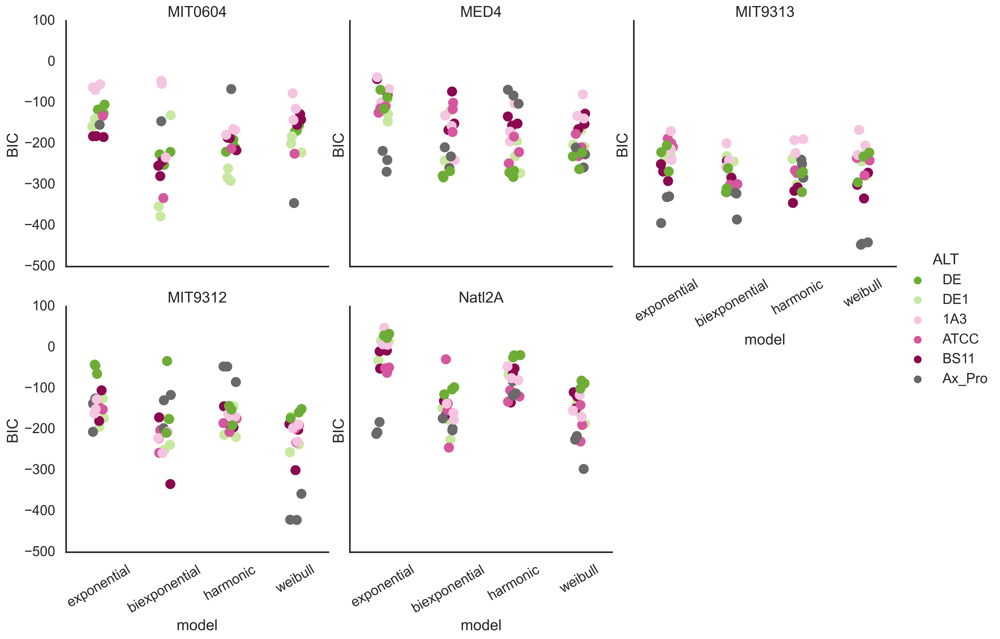

In [35]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')
#plt.xlabel 

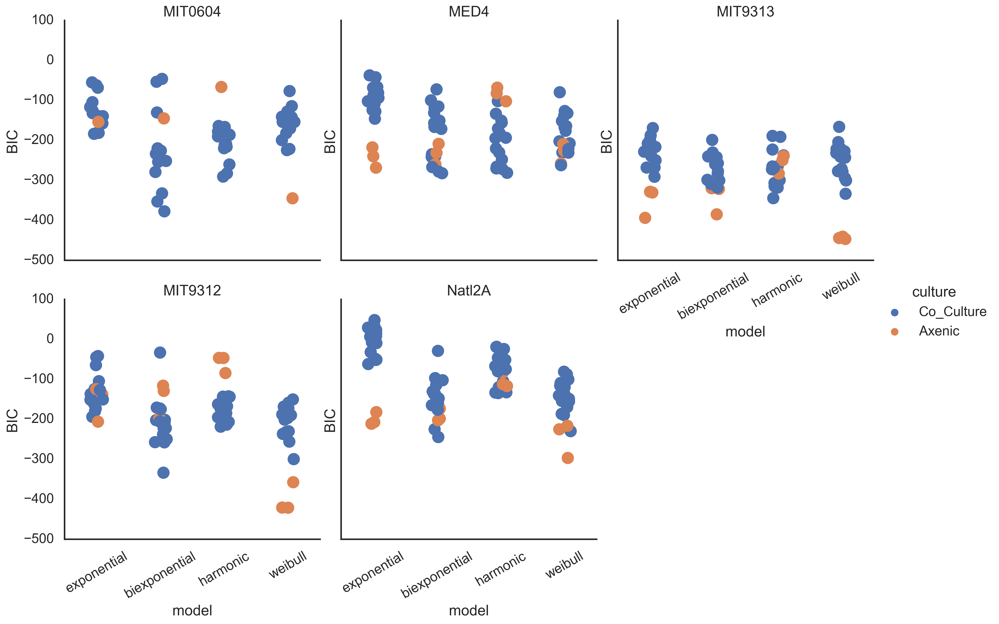

In [36]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', hue='culture', x='model', col_wrap=3,
    row_order=porder, 
    #hue_order=aorder + ['Ax_Pro'], 
    #palette=[PRO],
    y='value', edgecolor='white', 
    s=15
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


In [37]:
df.ALT.unique()

array(['DE', 'DE1', 'BS11', '1A3', 'ATCC', 'Ax_Pro'], dtype=object)

In [38]:
tdf = mdf.loc[mdf.metric.isin(['bic'])]

bestdf = tdf.loc[tdf.groupby('experiment_sample').value.idxmin()].reset_index(drop=True)

In [39]:
sns.catplot(data=bestdf, x='model', row='experiment', col='PRO',
            col_order=porder,
            kind='count', hue='culture')

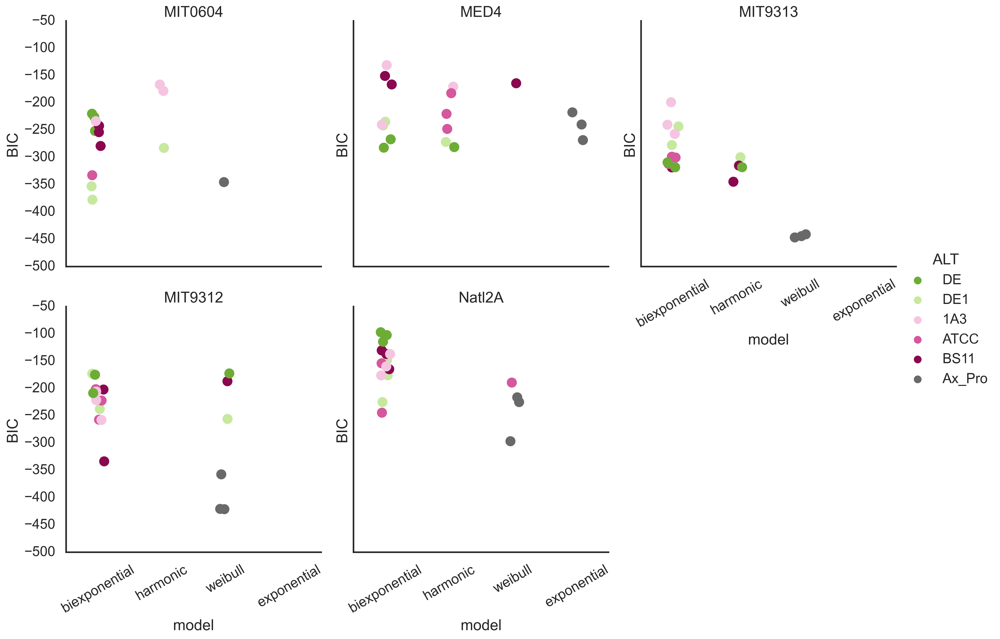

In [40]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


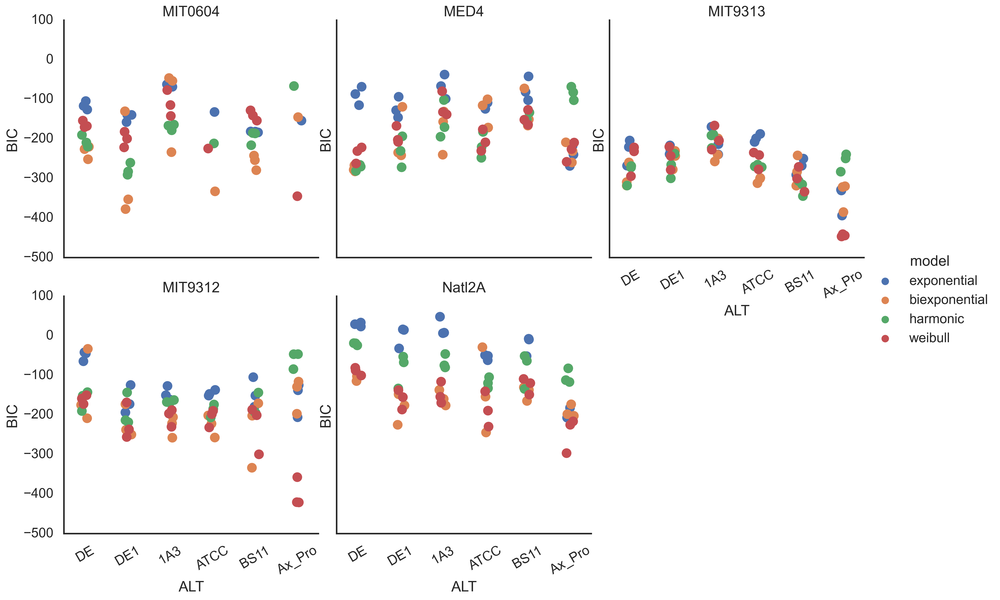

In [41]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', x='ALT', hue='model', col_wrap=3,
    row_order=porder, 
    order=aorder + ['Ax_Pro'], 
    #palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


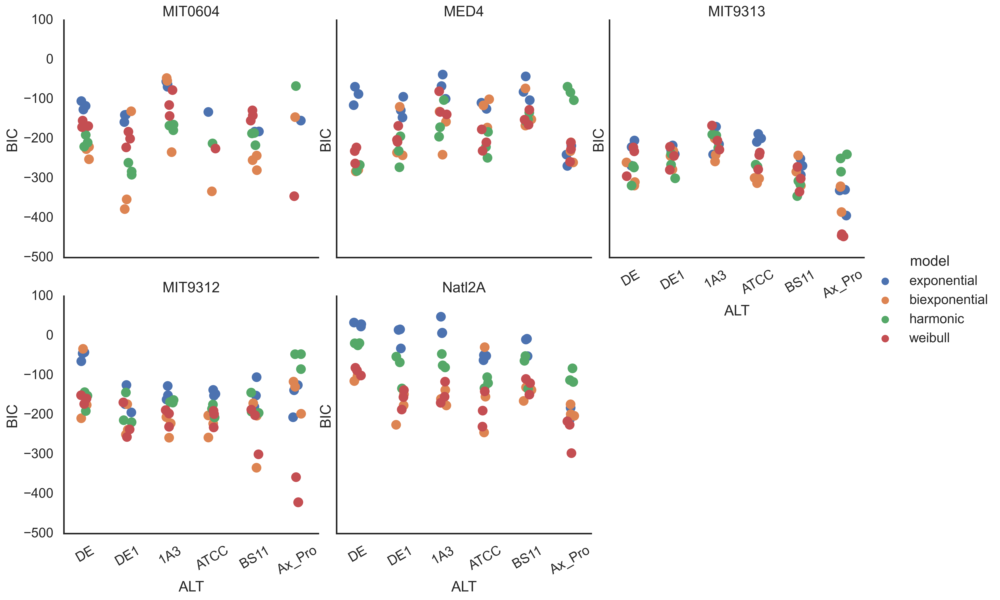

In [42]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', x='ALT', hue='model', col_wrap=3,
    row_order=porder, 
    order=aorder + ['Ax_Pro'], 
    #palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


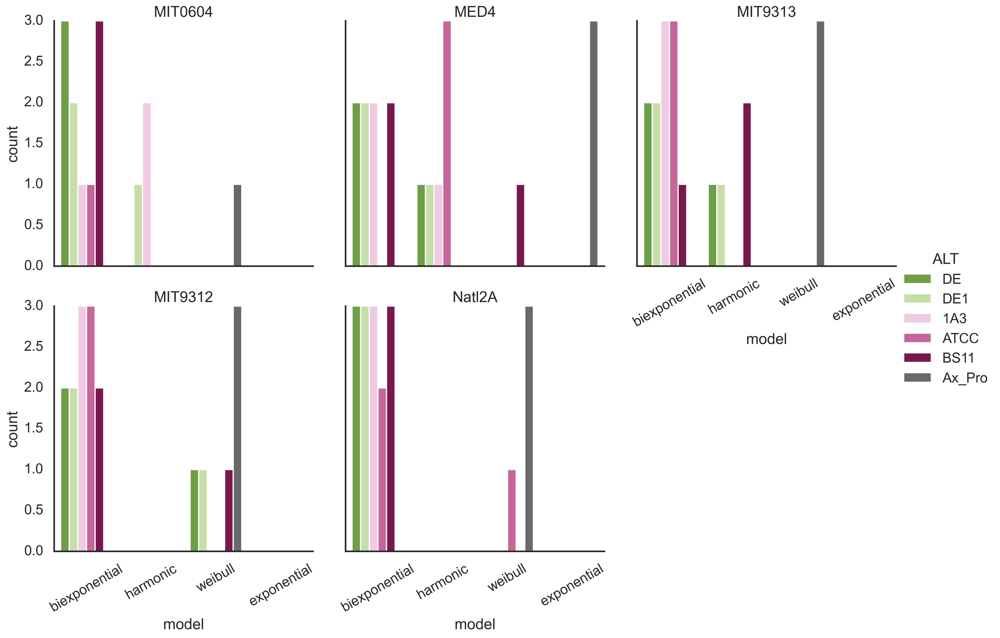

In [43]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
     edgecolor='white', 
    kind='count'
    
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    )


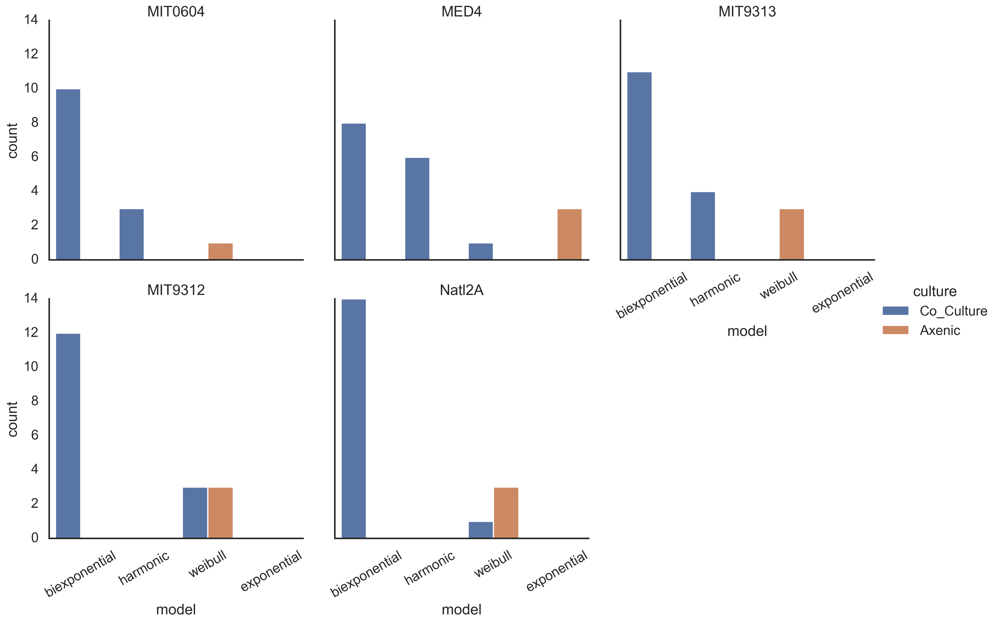

In [44]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='culture', x='model', col_wrap=3,
    row_order=porder, 
    #hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
     edgecolor='white', 
    kind='count'
    
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    )


In [45]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

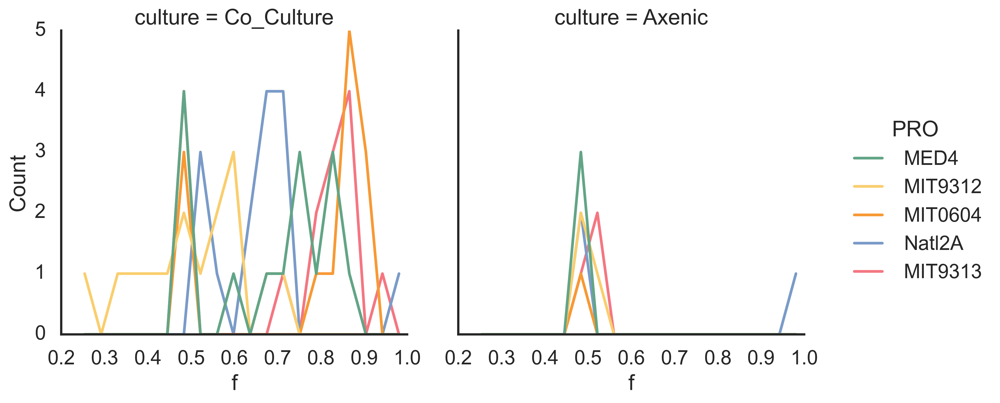

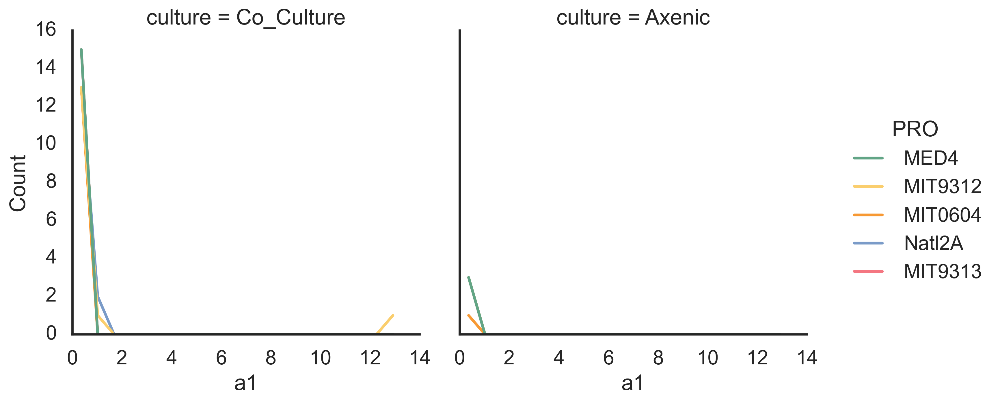

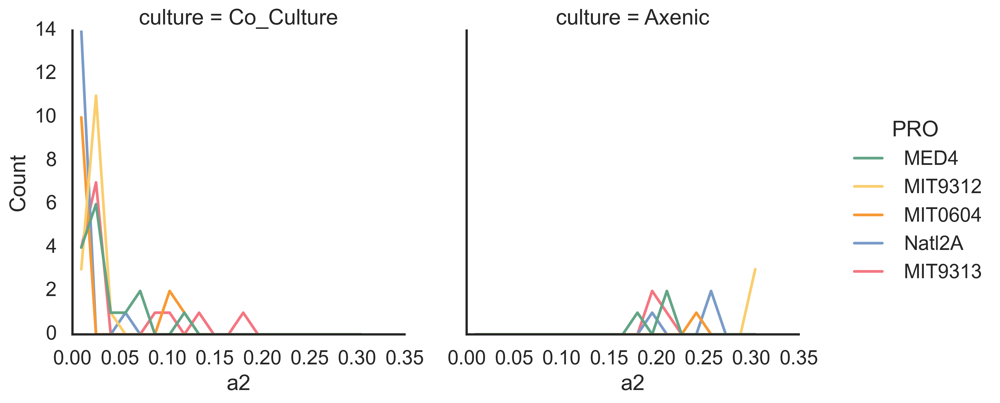

In [32]:
for c in ['f', 'a1', 'a2']:
    sns.displot(data=df.loc[df.experiment.isin(['e1'])], 
            x=c, 
            hue='PRO', hue_order=porder, palette=ppallete,
            bins=20, fill=False, element='poly',
            col='culture')

In [33]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [136]:
t = df['biexponential_popt_0'] > df['biexponential_popt_1']
df.loc[t, 'biexp_a1'] = df.loc[t, 'biexponential_popt_0']
df.loc[t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_1']
df.loc[t, 'biexp_f'] = df.loc[t, 'biexponential_popt_2']
df.loc[~t, 'biexp_a1'] = df.loc[~t, 'biexponential_popt_1']
df.loc[~t, 'biexp_a2'] = df.loc[~t, 'biexponential_popt_0']
df.loc[~t, 'biexp_f'] = 1 - df.loc[~t, 'biexponential_popt_2']

In [63]:
t = df['biexponential_popt_2'] > 0.5
df.loc[t, 'biexp_a1'] = df.loc[t, 'biexponential_popt_0']
df.loc[t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_1']
df.loc[t, 'biexp_f'] = df.loc[t, 'biexponential_popt_2']
df.loc[~t, 'biexp_a1'] = df.loc[~t, 'biexponential_popt_1']
df.loc[~t, 'biexp_a2'] = df.loc[~t, 'biexponential_popt_0']
df.loc[~t, 'biexp_f'] = 1 - df.loc[~t, 'biexponential_popt_2']

In [137]:
df.loc[df.biexp_a2 > 10]

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,weibull_td,weibull_td2,p,PRO2,PA,biexp_a1,biexp_a2,biexp_f,biexp_diff_a1_a2,diff_bi_a1_exp_a


In [138]:
df.loc[df.experiment.isin(['e1']) & (df.biexp_a2 > df.biexp_a1) & (df.biexp_diff_a1_a2 < -0.05)]

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,weibull_td,weibull_td2,p,PRO2,PA,biexp_a1,biexp_a2,biexp_f,biexp_diff_a1_a2,diff_bi_a1_exp_a


In [139]:
df.loc[df.biexp_f > .8]

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,weibull_td,weibull_td2,p,PRO2,PA,biexp_a1,biexp_a2,biexp_f,biexp_diff_a1_a2,diff_bi_a1_exp_a
0,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,37.725443,544.100668,MIT0604,MIT0604,"MIT0604,DE",0.374863,0.008879,0.863408,0.365983,0.233842
1,1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.142509,0.5,0.5,...,45.567042,625.988060,MIT0604,MIT0604,"MIT0604,DE",0.380370,0.009144,0.843629,0.371226,0.237861
2,2,"e1, 10C",e1,10C,MIT0604,DE,Co_Culture,0.164214,0.5,0.5,...,33.456743,634.710276,MIT0604,MIT0604,"MIT0604,DE",0.365484,0.008610,0.869769,0.356874,0.201270
3,3,"e1, 11A",e1,11A,MED4,DE1,Co_Culture,0.101841,1.0,1.0,...,31.987654,112.851280,MED4,MED4,"MED4,DE1",0.170692,0.021516,0.824206,0.149177,0.068851
7,7,"e1, 12B",e1,12B,MIT9313,DE1,Co_Culture,0.123779,0.5,0.5,...,31.041812,173.396538,MIT9313,MIT9313,"MIT9313,DE1",0.221290,0.017819,0.834458,0.203471,0.097511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,334,"e6, 2A",e6,2A,MIT9313,1A3,Co_Culture,0.063727,1.0,1.0,...,57.704273,209.522897,MIT9313,MIT9313,"MIT9313,1A3",0.093407,-0.003655,0.909087,0.097062,0.029681
335,335,"e6, 2C",e6,2C,MIT9313,1A3,Co_Culture,0.054612,0.5,0.5,...,50.780443,122.341415,MIT9313,MIT9313,"MIT9313,1A3",0.065547,-0.024341,0.978184,0.089888,0.010935
342,342,"e6, 5A",e6,5A,MIT0604,1A3,Co_Culture,0.158886,1.0,1.0,...,38.261909,251.407060,MIT0604,MIT0604,"MIT0604,1A3",0.344489,0.014481,0.810101,0.330008,0.185603
343,343,"e6, 5B",e6,5B,MIT0604,1A3,Co_Culture,0.172702,0.5,0.5,...,27.942935,122.156808,MIT0604,MIT0604,"MIT0604,1A3",0.266836,0.014106,0.869991,0.252730,0.094134


(-1.0, 1.0)

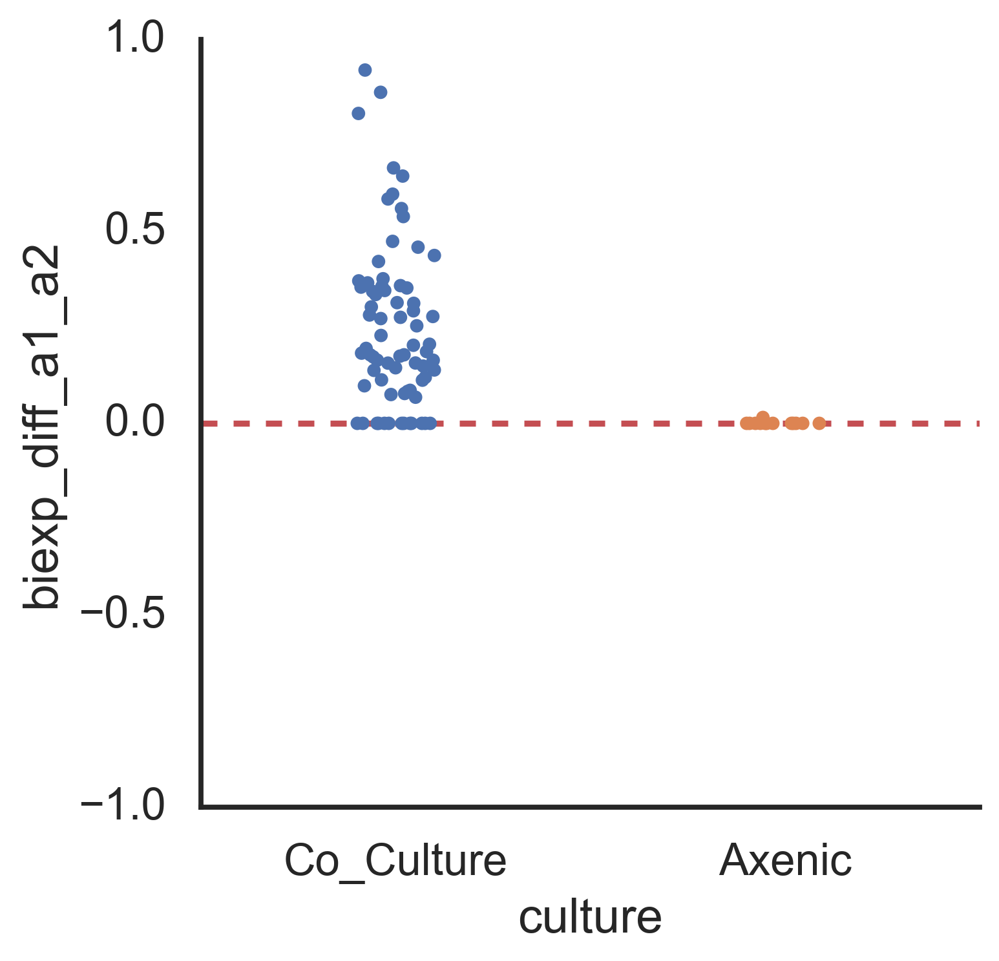

In [140]:
df['biexp_diff_a1_a2'] = df['biexp_a1'] - df['biexp_a2']
sns.catplot(data=df.loc[df.experiment.isin(['e1']) ], x='culture', y='biexp_diff_a1_a2')
plt.axhline(0, c='r', ls='--')
plt.ylim((-1,1))


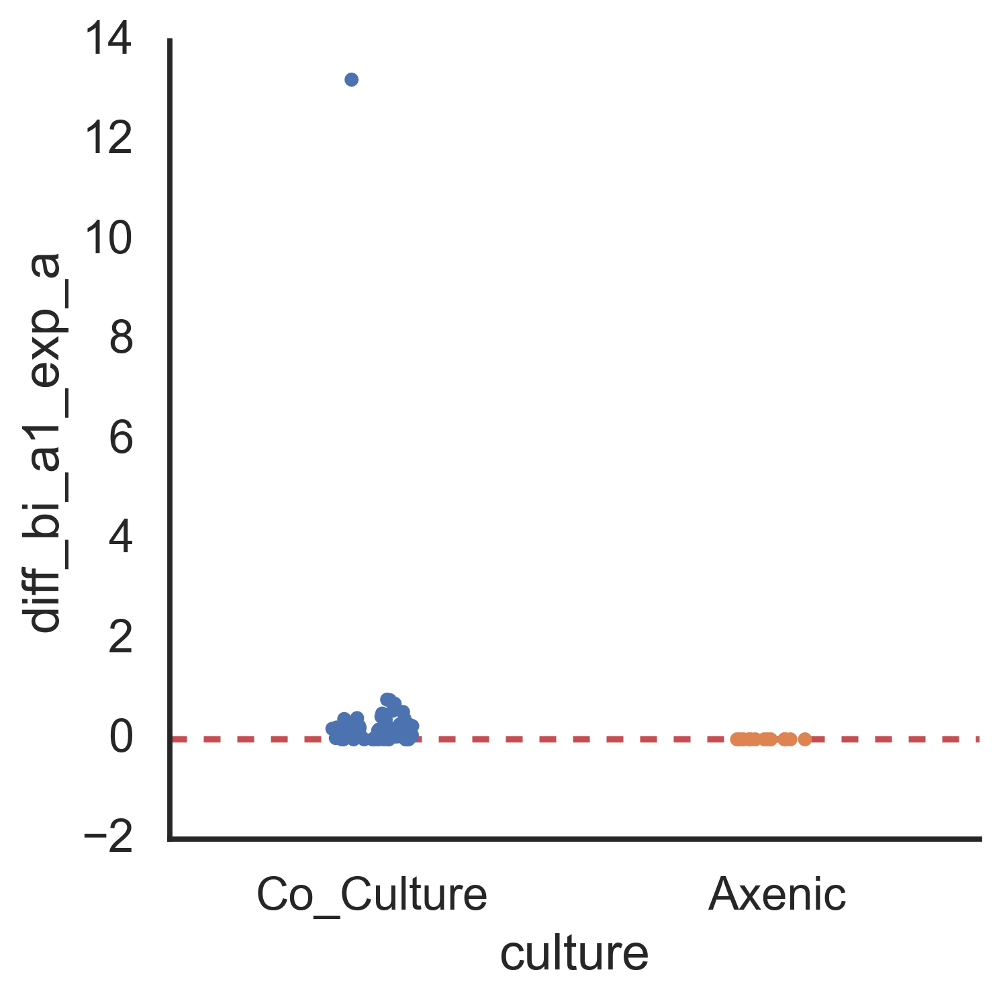

In [141]:
df['diff_bi_a1_exp_a'] = df['biexp_a1'] - df['exponential_popt_0']
sns.catplot(data=df.loc[df.experiment.isin(['e1']) ], x='culture', y='diff_bi_a1_exp_a')
plt.axhline(0, c='r', ls='--')
#plt.ylim((-1,1))


(-0.05, 1.0)

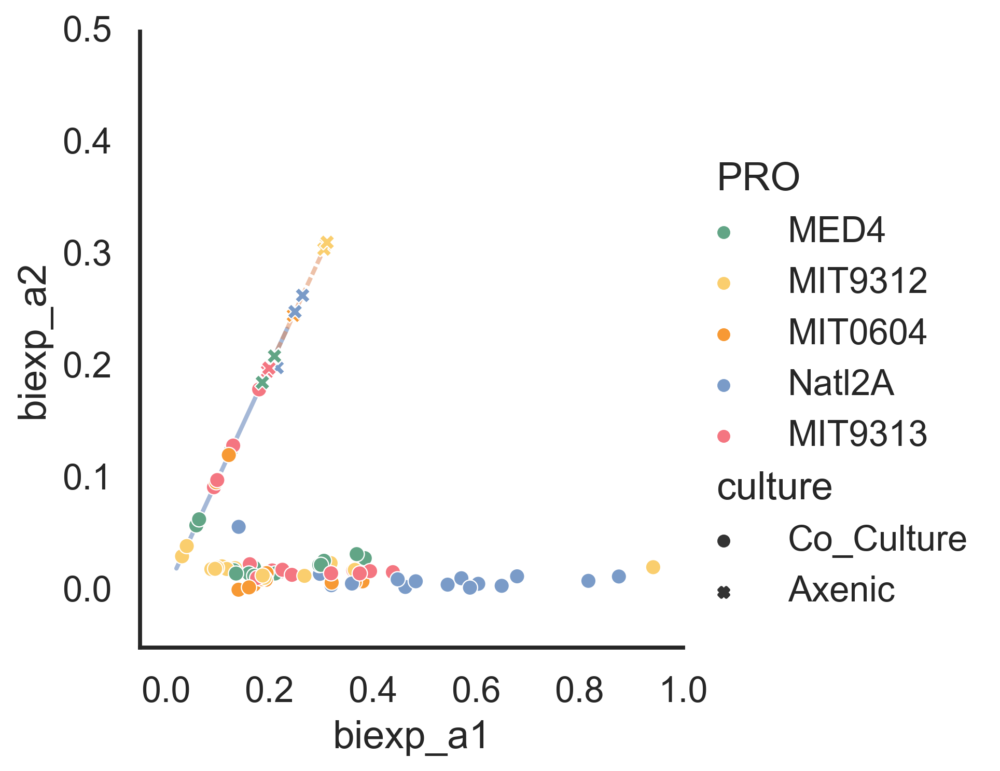

In [142]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', 
                 style='culture',
                 #size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
                 s=50,
            #col='culture',
            #sharey=False,
           )
sns.lineplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='exponential_popt_0', y= 'exponential_popt_0', hue= 'culture', style='culture', legend=False,
            zorder=-2, lw=2, alpha=0.5
            #col='culture',
            #sharey=False,
           )
plt.ylim((-0.05,0.5))
plt.xlim((-0.05,1))


(-0.05, 1.0)

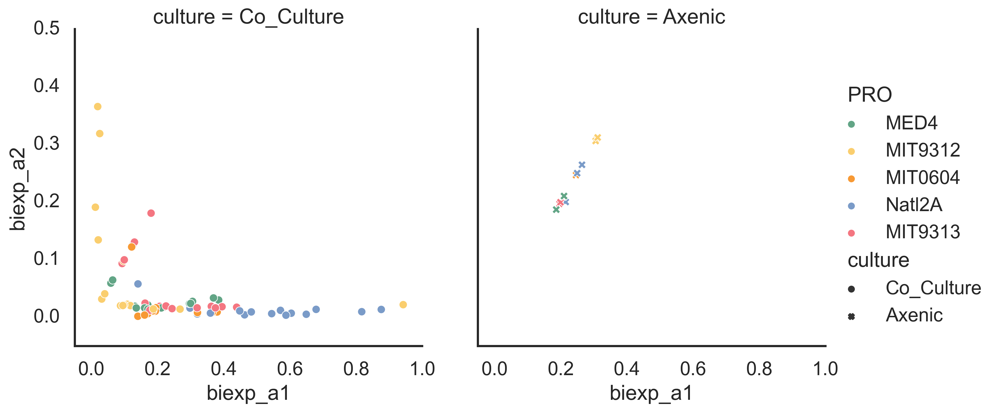

In [119]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', 
                 style='culture', col='culture',
                 #size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
                 s=50,
            #col='culture',
            #sharey=False,
           )
# sns.lineplot(data=df.loc[df.experiment.isin(['e1']) ], 
#             x='exponential_popt_0', y= 'exponential_popt_0', hue= 'culture', style='culture', legend=False,
#             zorder=-2, lw=5, alpha=0.5
#             #col='culture',
#             #sharey=False,
#            )
plt.ylim((-0.05,0.5))
plt.xlim((-0.05,1))


(-0.05, 1.0)

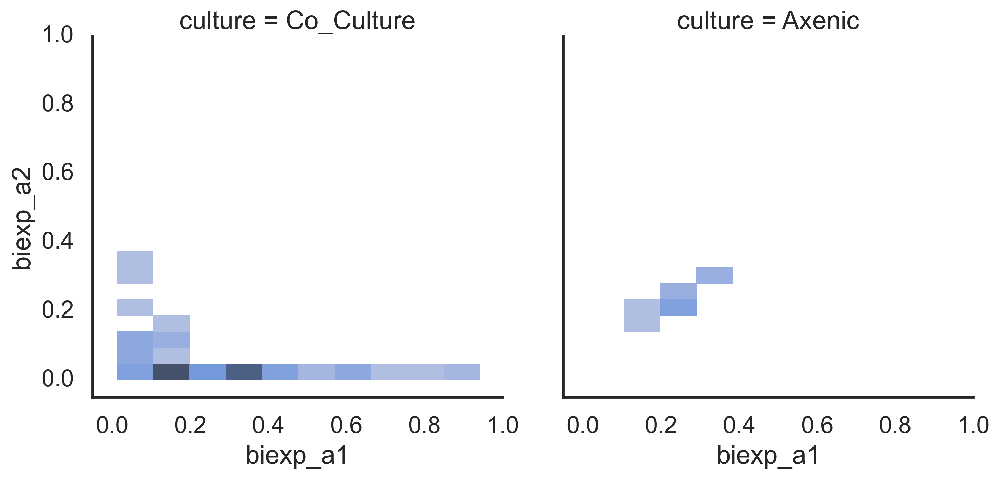

In [79]:
ax = sns.displot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', 
                 col='culture', 
             #    size='biexp_f',
            #hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
plt.ylim((-0.05,1))
plt.xlim((-0.05,1))


(0.0, 1.0)

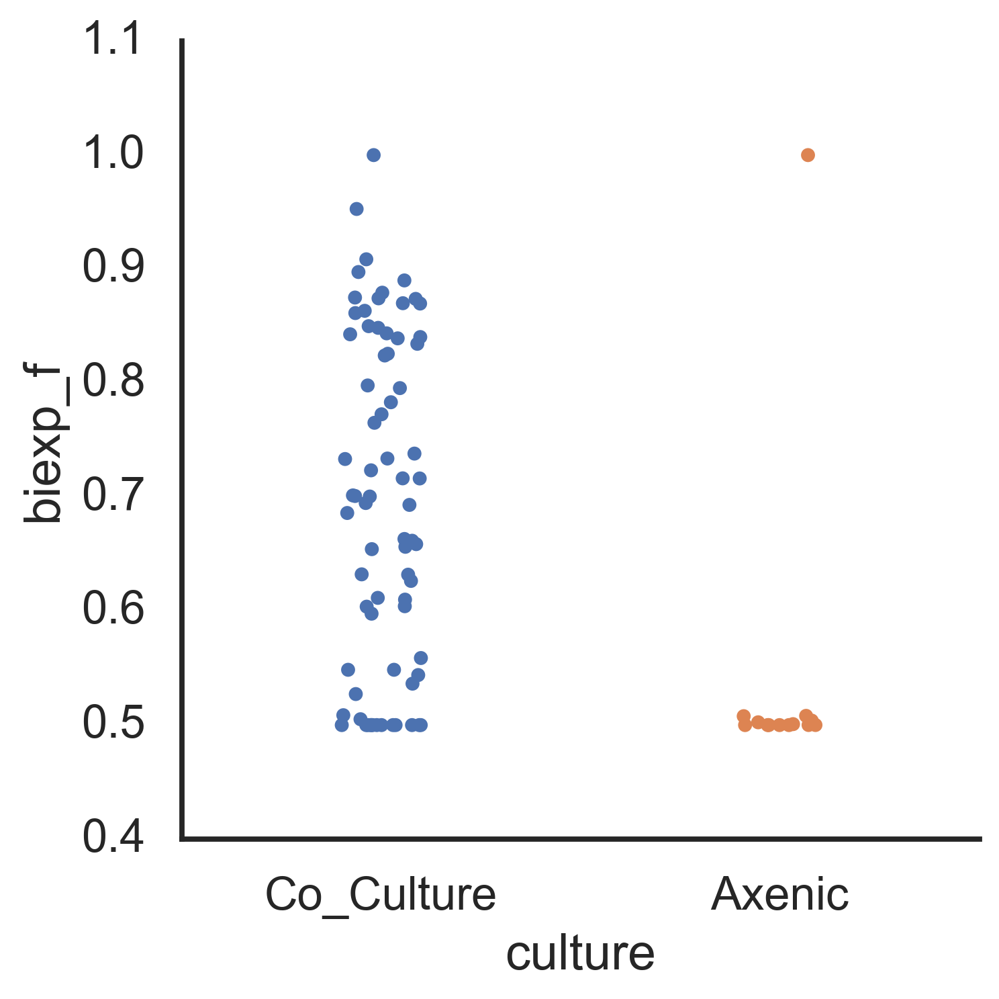

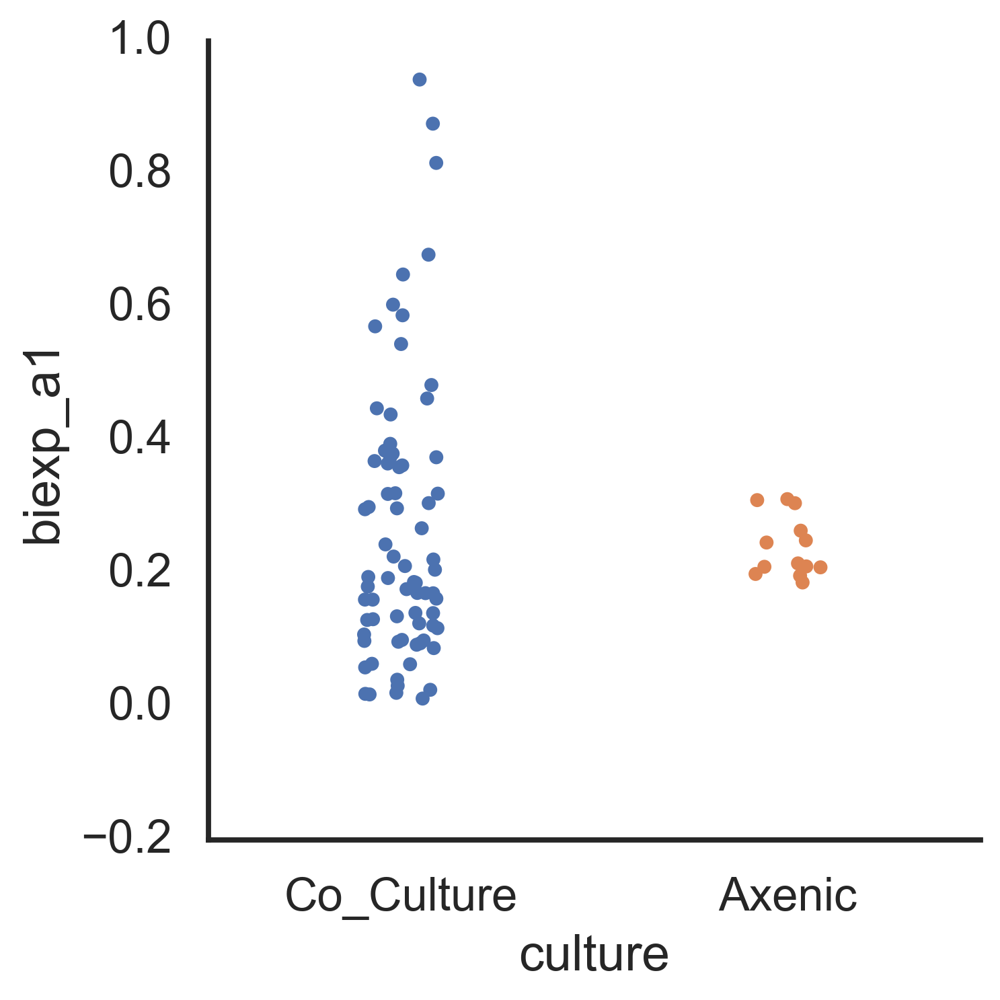

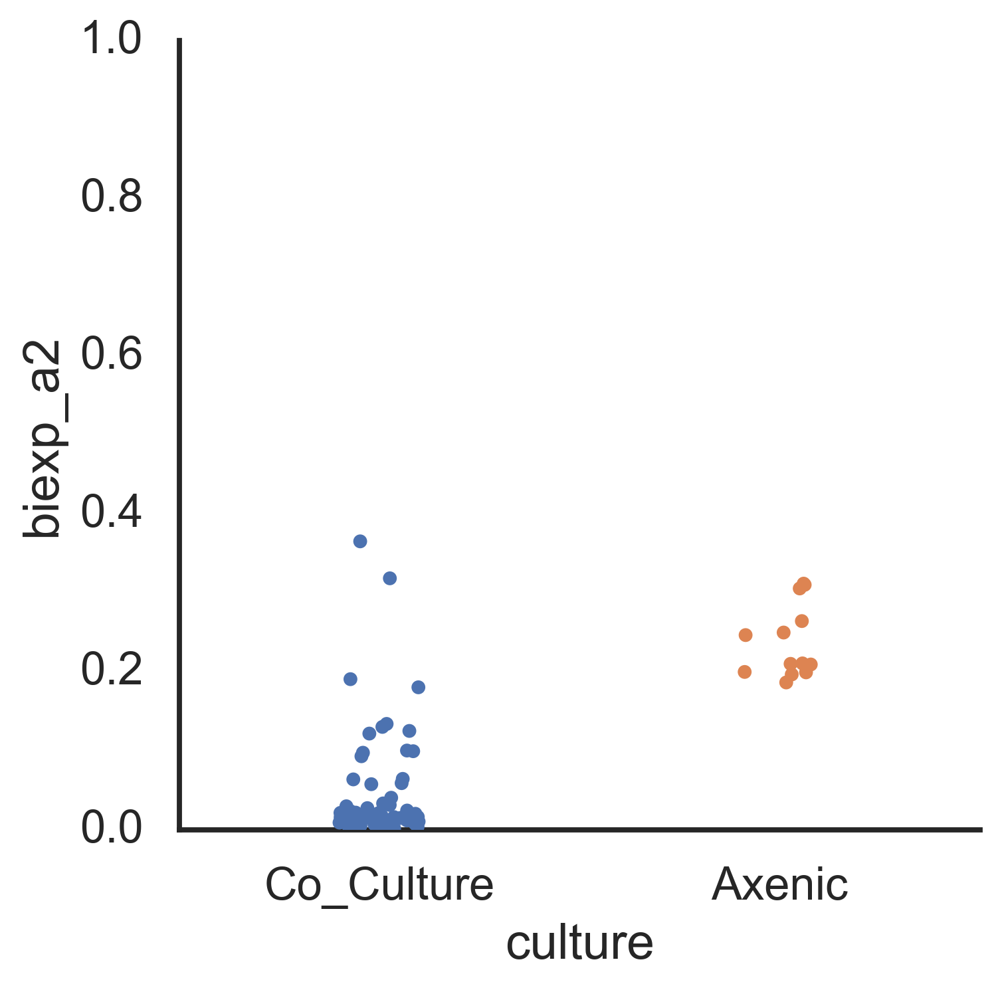

In [74]:
sns.catplot(data=df.loc[df.experiment.isin(['e1']) ], x='culture', y='biexp_f')
sns.catplot(data=df.loc[df.experiment.isin(['e1']) ], x='culture', y='biexp_a1')
sns.catplot(data=df.loc[df.experiment.isin(['e1']) ], x='culture', y='biexp_a2')
plt.ylim(0,1)


In [107]:
df.loc[df.experiment.isin(['e1']) ].groupby('culture')['biexp_a1'].describe()

,count,mean,std,min,25%,50%,75%,max
culture,,,,,,,,
Axenic,13.0,0.239925,0.045482,0.186773,0.209512,0.215409,0.264574,0.311974
Co_Culture,73.0,0.264555,0.208364,0.012370,0.118091,0.193418,0.369158,0.942317


In [143]:
df.loc[df.experiment.isin(['e1']) & (abs(df['biexp_diff_a1_a2']) < 0.05) ].groupby('culture')['biexp_a1'].describe()

,count,mean,std,min,25%,50%,75%,max
culture,,,,,,,,
Axenic,13.0,0.239925,0.045481,0.186773,0.209520,0.215409,0.264574,0.311974
Co_Culture,13.0,0.093022,0.041226,0.031563,0.063916,0.097704,0.121975,0.180609


In [134]:
df.loc[df.experiment.isin(['e1']) & (
    df['biexp_diff_a1_a2'] < -0.05) & df.culture.isin(['Co_Culture'])
      ].pivot_table(index='PRO', columns='ALT', values='sample', aggfunc='count')

ALT,ATCC,DE1
PRO,,
MIT9312,3,2


In [155]:
df.loc[df.experiment.isin(['e1']) & 
       (df['biexp_diff_a1_a2'] > 0.05) & (df.biexp_a1<10) & 
       df.culture.isin(['Co_Culture']),
                                    
       ['biexp_a1', 'biexp_a2', 'biexp_f']].describe()

,biexp_a1,biexp_a2,biexp_f
count,59.000000,59.000000,59.000000
mean,0.322302,0.015862,0.719375
std,0.197445,0.008917,0.152183
min,0.088174,0.001688,0.345671
25%,0.170848,0.009415,0.619027
50%,0.298137,0.016116,0.723472
75%,0.382581,0.020160,0.846043
max,0.942317,0.057839,1.000000


(0.0, 1.0)

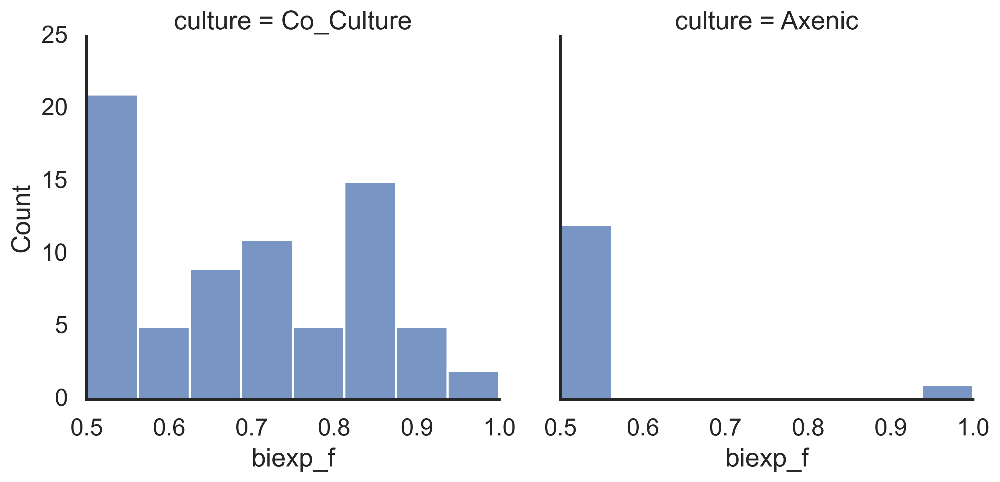

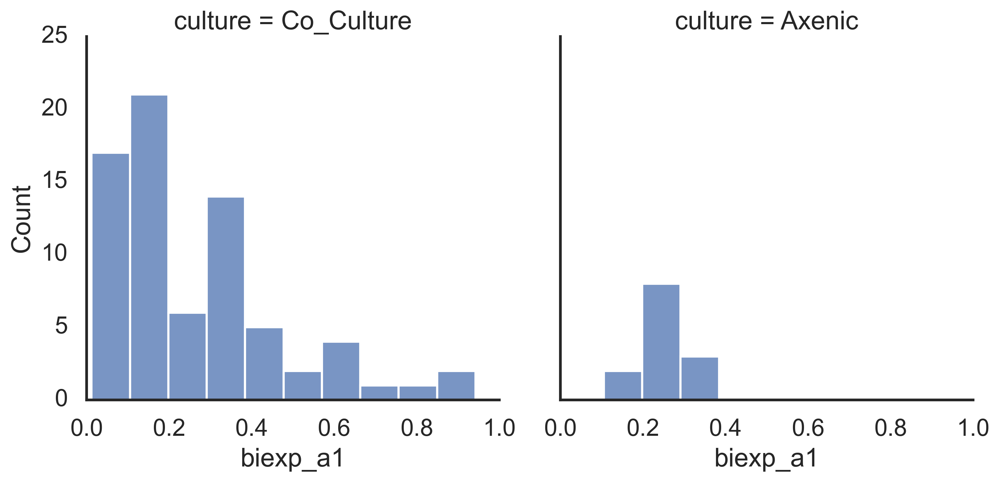

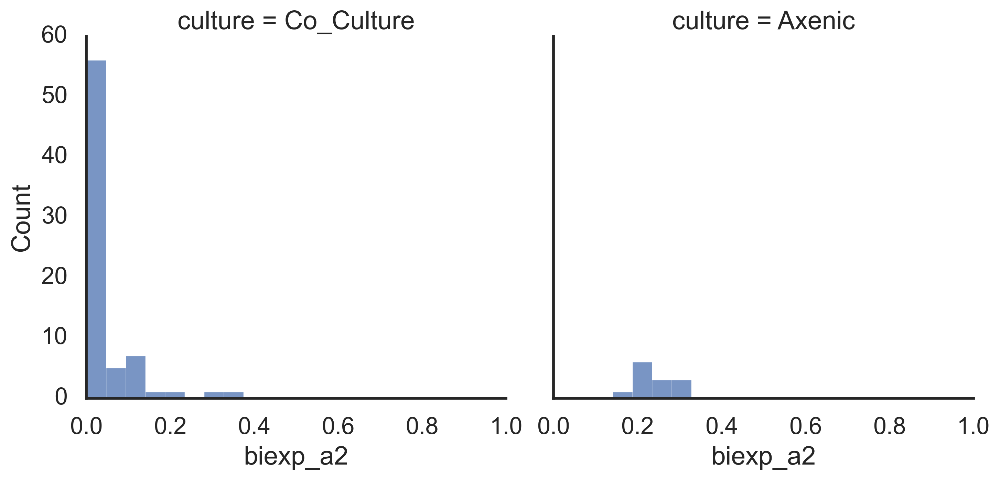

In [106]:
sns.displot(data=df.loc[df.experiment.isin(['e1']) ], col='culture', x='biexp_f')
sns.displot(data=df.loc[df.experiment.isin(['e1']) ], col='culture', x='biexp_a1')
sns.displot(data=df.loc[df.experiment.isin(['e1']) ], col='culture', x='biexp_a2')
plt.xlim(0,1)


<AxesSubplot:xlabel='biexp_a1', ylabel='biexp_a2'>

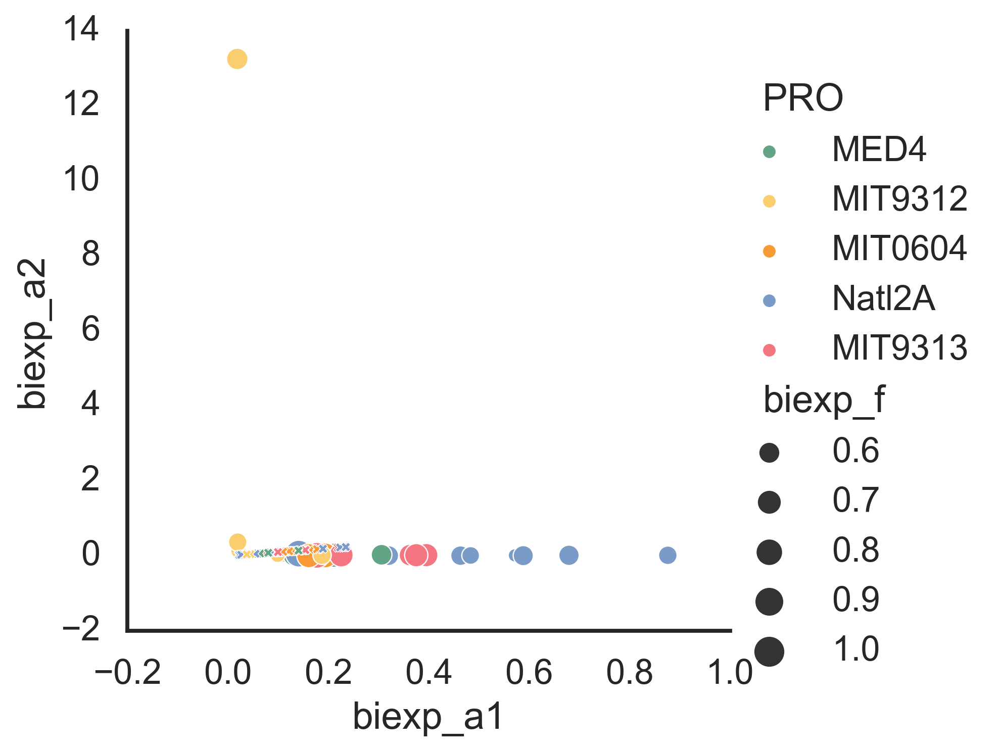

In [36]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.culture.isin(['Co_Culture'])], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', style='culture',
                 size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.culture.isin(['Co_Culture'])], 
            x='exponential_popt_0', y= 'exponential_popt_0', markers=['X'], style='culture', legend=False,
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.ylim((-0.1,2))


C:\Users\wosnat\Anaconda3\lib\site-packages\seaborn\relational.py:644: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  points = ax.scatter(*args, **kws)


<AxesSubplot:xlabel='biexp_a1', ylabel='biexp_a2'>

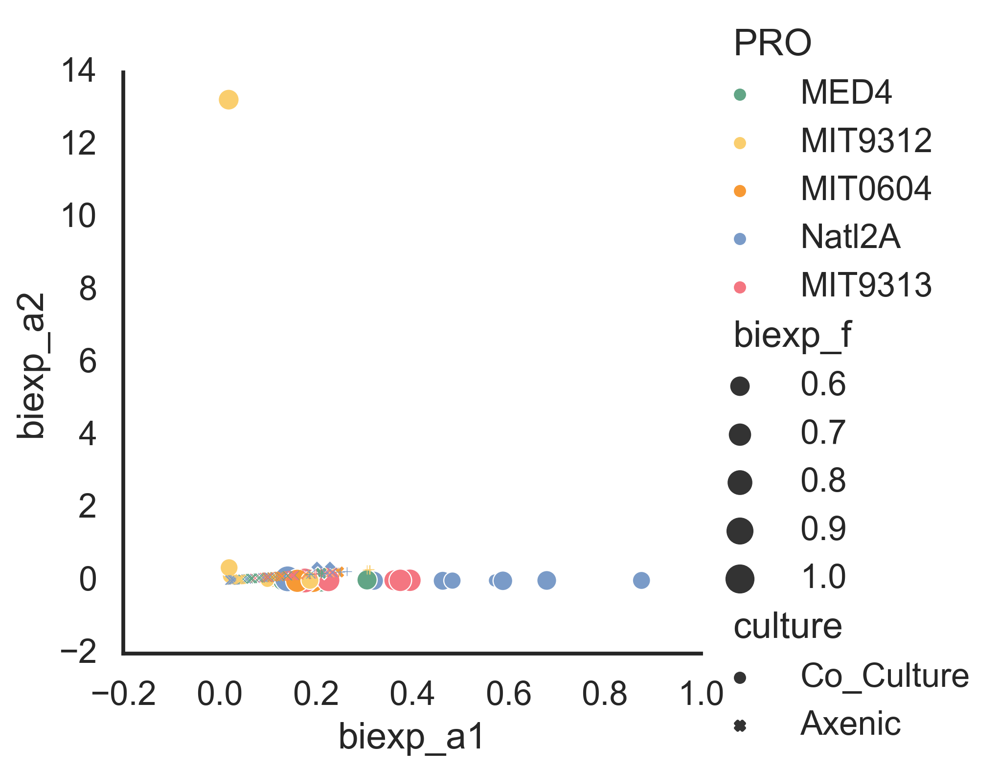

In [37]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', 
                 style='culture',
                 size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='exponential_popt_0', y= 'exponential_popt_0', markers=['x', '+'], style='culture', legend=False,
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.ylim((-0.1,0.6))


In [38]:
df.loc[df.experiment.isin(['e1'])].groupby('culture')[['biexp_a1', 'biexp_a2', 'biexp_f',]].describe().T

culture            Axenic  Co_Culture
biexp_a1 count  13.000000   73.000000
         mean    0.239925    0.264555
         std     0.045482    0.208364
         min     0.186773    0.012370
         25%     0.209512    0.118091
         50%     0.215409    0.193418
         75%     0.264574    0.369158
         max     0.311974    0.942317
biexp_a2 count   3.000000   34.000000
         mean    0.219056    0.419629
         std     0.024541    2.268242
         min     0.200074    0.003545
         25%     0.205199    0.012023
         50%     0.210324    0.016215
         75%     0.228546    0.021441
         max     0.246769   13.251643
biexp_f  count   3.000000   34.000000
         mean    0.666687    0.745514
         std     0.288657    0.128522
         min     0.500000    0.508662
         25%     0.500031    0.656976
         50%     0.500061    0.751667
         75%     0.750030    0.847544
         max     1.000000    1.000000

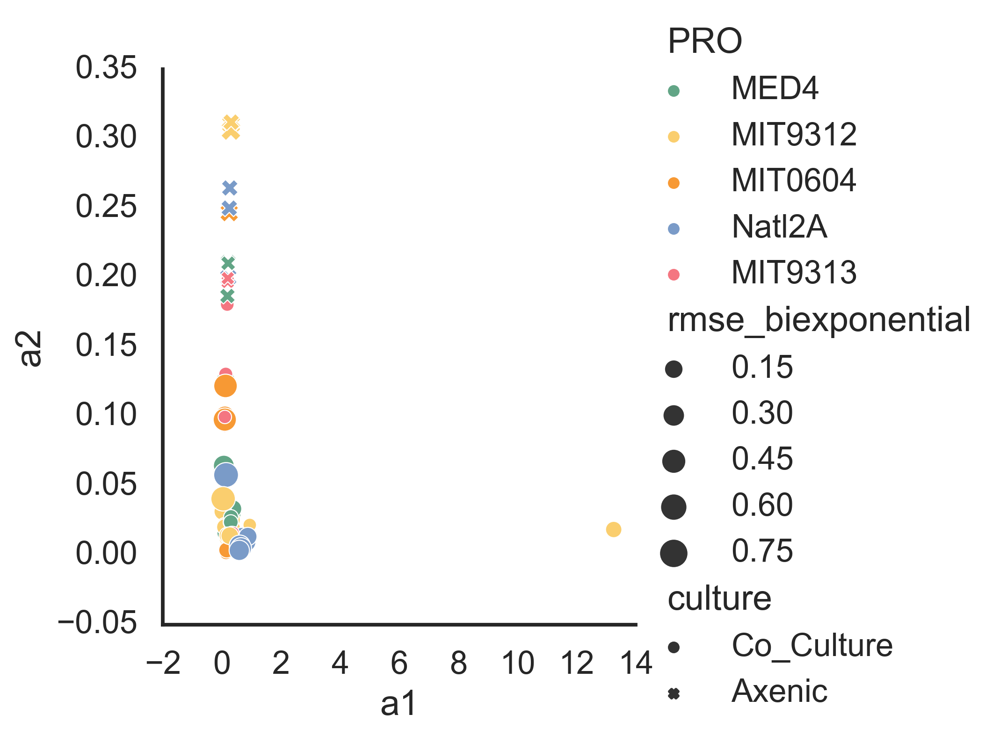

In [39]:
sns.relplot(data=df.loc[df.experiment.isin(['e1'])# & df.culture.isin(['Co_Culture'])
                       ], 
            x='a1', y= 'a2', size='rmse_biexponential', style='culture',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.xlim((-0.1,2))

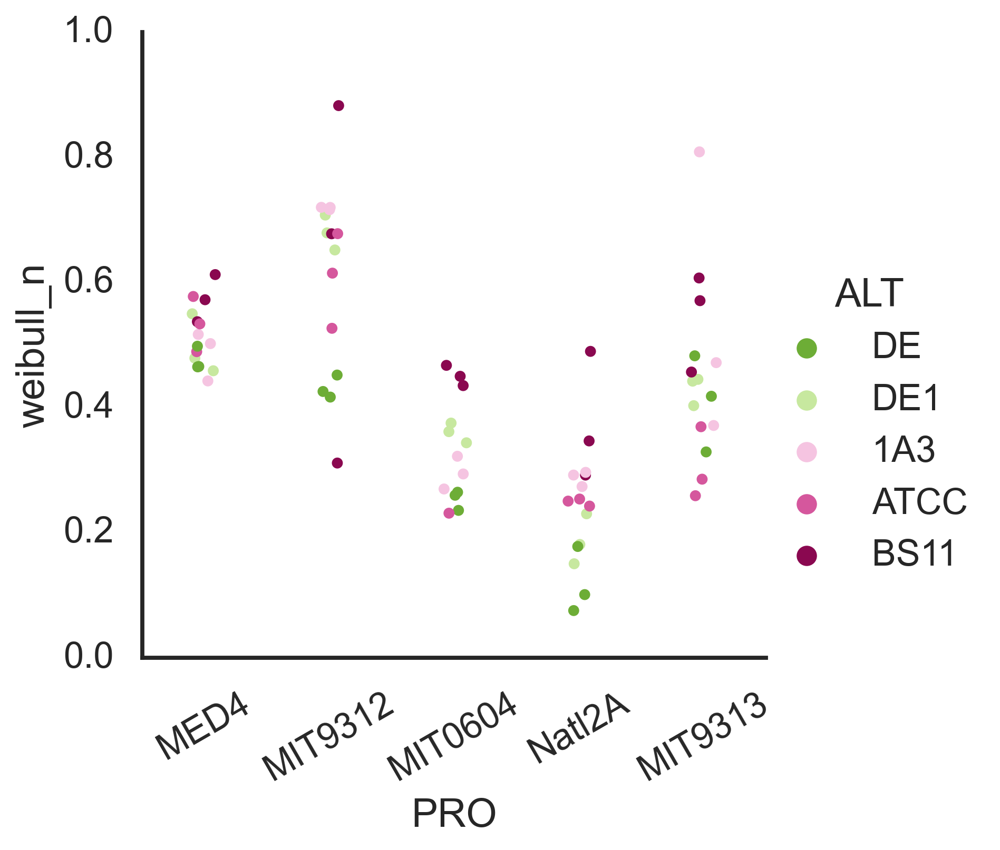

In [40]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.variable.isin(['weibull_n'])],
    x='PRO', hue='ALT', 
    order=porder, 
    hue_order=aorder, #+ ['Ax_Pro'], 
    palette=apallete, #+ ['dimGrey'],
    y='value', edgecolor='white', #s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='weibull_n')


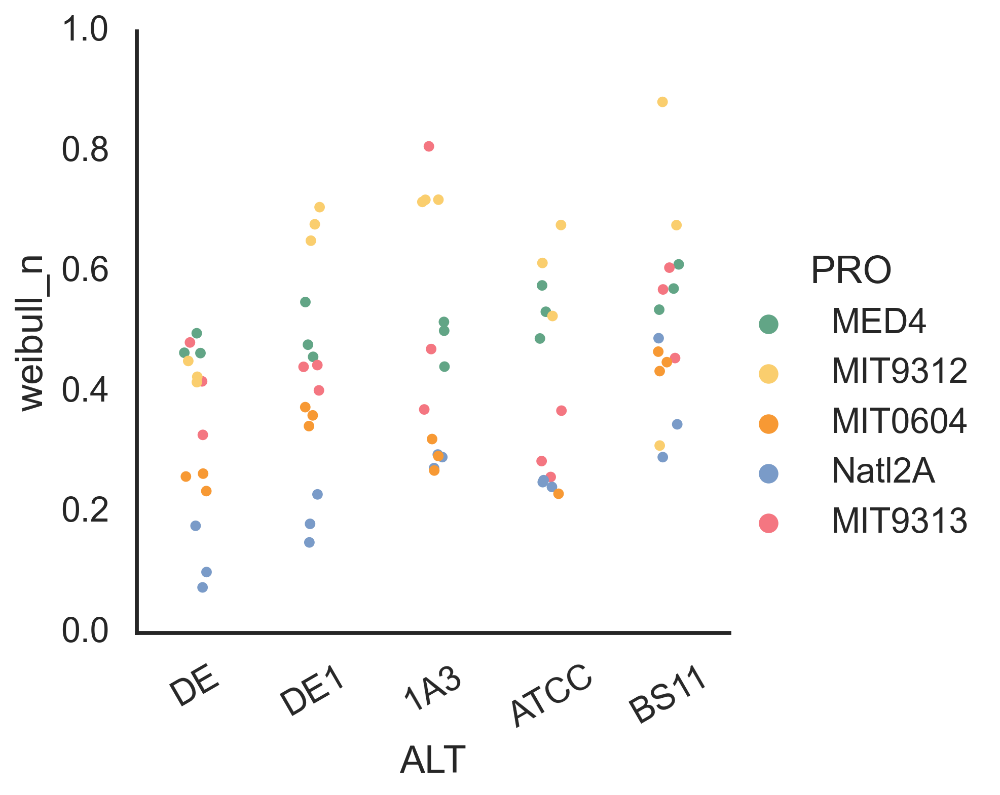

In [41]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.variable.isin(['weibull_n'])],
    hue='PRO', x='ALT', 
    hue_order=porder, 
    order=aorder, #+ ['Ax_Pro'], 
    palette=ppallete, #+ ['dimGrey'],
    y='value', edgecolor='white', #s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='weibull_n')


In [42]:
capdf = pd.read_csv('capacity.csv.gz')

In [43]:
capdf.head()

,Unnamed: 0,PRO,ALT,sample,PRO.1,ALT.1,experiment,day,culture,pair,...,C[Total] max,N[Total] min,N[Total] max,percent_N,percent_PRO,ALT_percent_increase,log2FC_ALT,PRO1,totalN,ALTN
0,0,MED4,1A3,1A,7.485642e+06,2.992351e+07,exp1,100,Co_Culture,"MED4,1A3",...,250.629251,31.528938,58.781727,25.514747,11.871066,97.051324,5.083789,MED4,31.528938,27.786117
1,1,MED4,1A3,1B,6.720907e+06,2.159764e+07,exp1,100,Co_Culture,"MED4,1A3",...,186.386490,23.415407,43.367866,18.948884,14.351463,95.914613,4.613384,MED4,23.415407,20.054954
2,2,MED4,1A3,1C,1.121335e+07,1.742056e+07,exp1,100,Co_Culture,"MED4,1A3",...,174.473089,21.782912,39.117684,17.627790,25.738868,94.935025,4.303301,MED4,21.782912,16.176237
3,3,MIT9313,1A3,2A,1.415617e+06,5.134250e+06,exp1,100,Co_Culture,"MIT9313,1A3",...,49.447977,6.183135,11.190614,5.003693,22.894811,82.814487,2.540735,MIT9313+1A3,6.183135,4.767518
4,4,MIT9313,1A3,2B,1.018640e+06,4.885134e+06,exp1,100,Co_Culture,"MIT9313,1A3",...,44.312983,5.554836,10.178654,4.495243,18.337892,81.938117,2.468980,MIT9313+1A3,5.554836,4.536196


In [44]:
capdf.columns

Index(['Unnamed: 0', 'PRO', 'ALT', 'sample', 'PRO.1', 'ALT.1', 'experiment',
       'day', 'culture', 'pair', 'C[PRO] min', 'C[PRO] max', 'N[PRO] min',
       'N[PRO] max', 'C[ALT] min', 'C[ALT] max', 'N[ALT] min', 'N[ALT] max',
       'C[Total] min', 'C[Total] max', 'N[Total] min', 'N[Total] max',
       'percent_N', 'percent_PRO', 'ALT_percent_increase', 'log2FC_ALT',
       'PRO1', 'totalN', 'ALTN'],
      dtype='object')

In [45]:
capdf['experiment_sample'] = capdf['experiment'] + ', ' + capdf['sample']
capdf['experiment_sample'] = capdf['experiment_sample'].str.replace('exp', 'e')

In [46]:
df = df.merge(capdf, on='experiment_sample',suffixes=('', '_cap'),)

In [47]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA', 'biexp_a1', 'biexp_a2',
       'biexp_f', 'Unnamed: 0_cap', 'PRO_cap', 'ALT_cap', 'sample_cap',
       'PRO.1', 'ALT.1', 'experiment_cap', 'day', 'culture_cap', 'pair',
       'C[PRO] min', 'C[PRO] max', 'N[PRO] min', 'N[PRO] max', 'C[ALT] min',
       'C[ALT] max', 'N[ALT] min', 'N[ALT] 

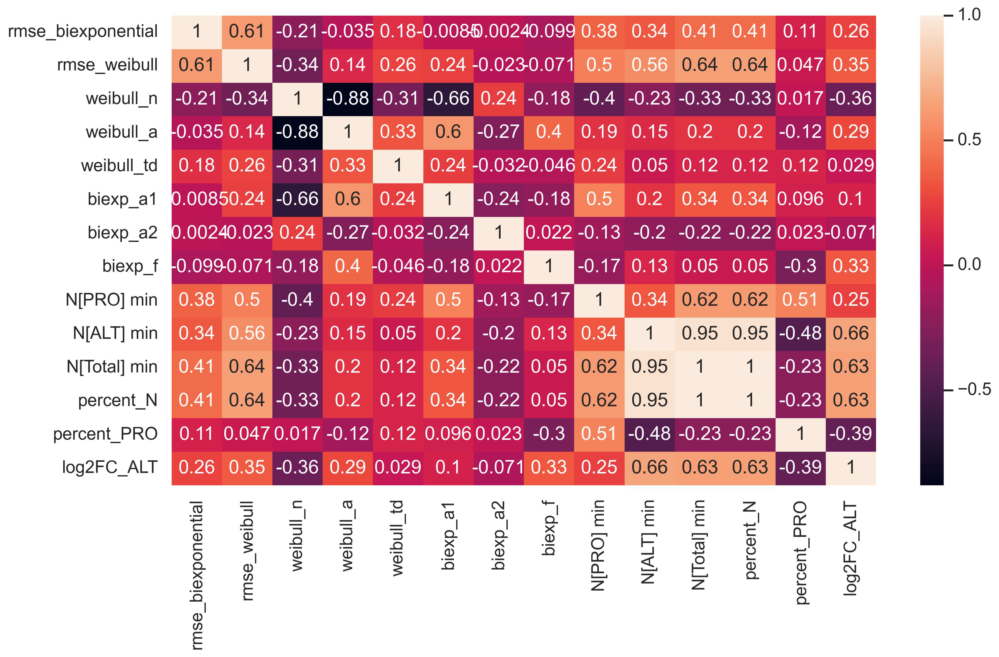

In [48]:
corr_cols = [
    'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', 'weibull_a', 'weibull_td',
        'biexp_a1', 'biexp_a2', 'biexp_f',  'N[PRO] min',
        'N[ALT] min', 
        'N[Total] min', 
       'percent_N','percent_PRO', 'log2FC_ALT',]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

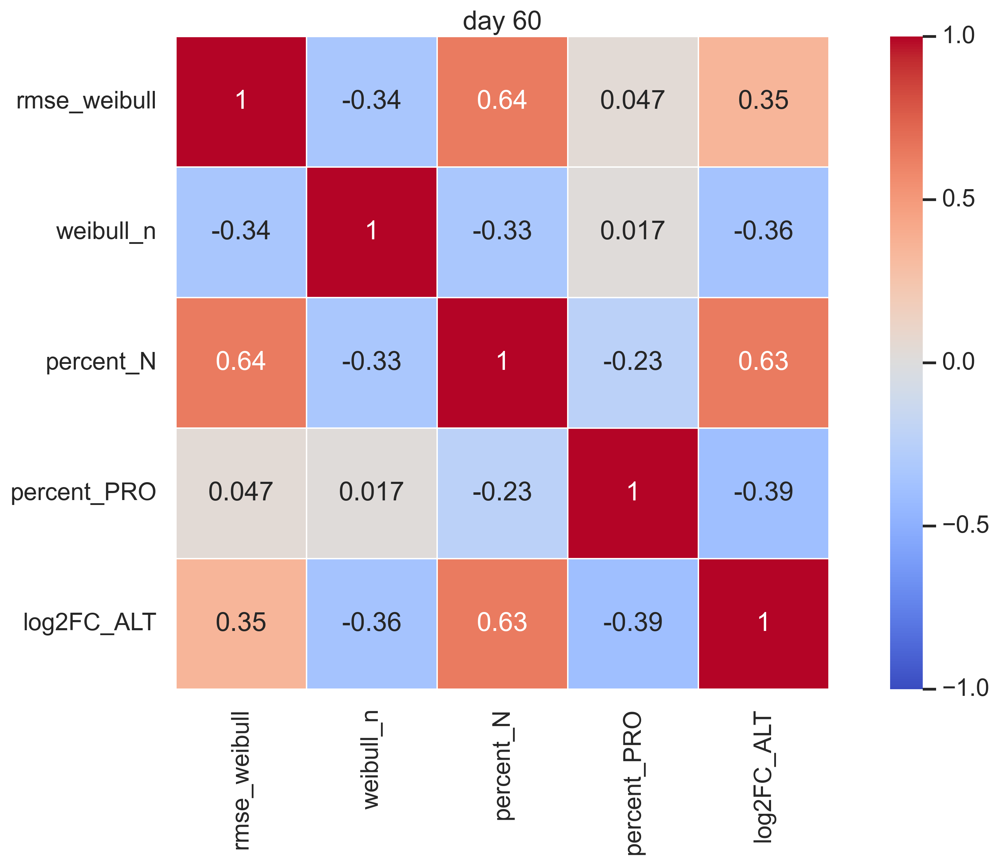

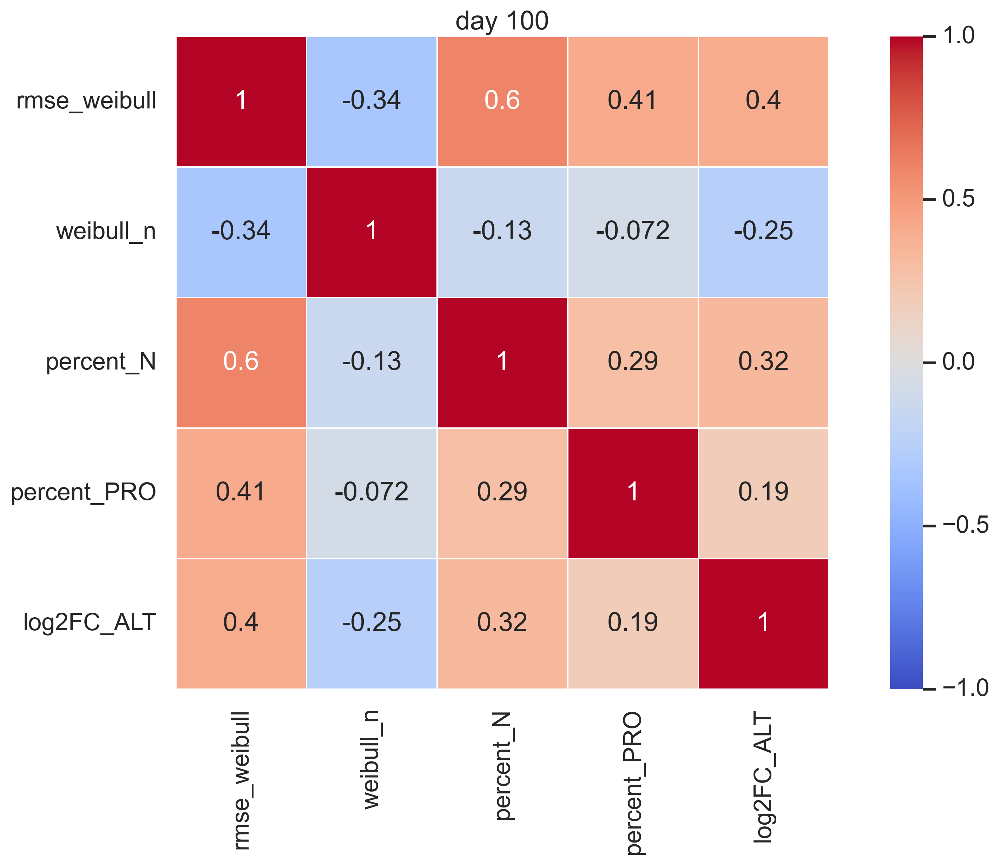

In [49]:
corr_cols = [
    #'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', #'weibull_a', 'weibull_td',
        #'biexp_a1', 'biexp_a2', 'biexp_f',  
  #  'N[PRO] min',
  #      'N[ALT] min', 
  #      'N[Total] min', 
       'percent_N','percent_PRO', 'log2FC_ALT',]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True, cmap='coolwarm',     
            linewidths=0.5, vmin=-1, vmax=1, square=True)
plt.title('day 60')
plt.show()
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['100']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True, cmap='coolwarm',
            linewidths=0.5, vmin=-1, vmax=1, square=True)
            
plt.title('day 100')
plt.show()

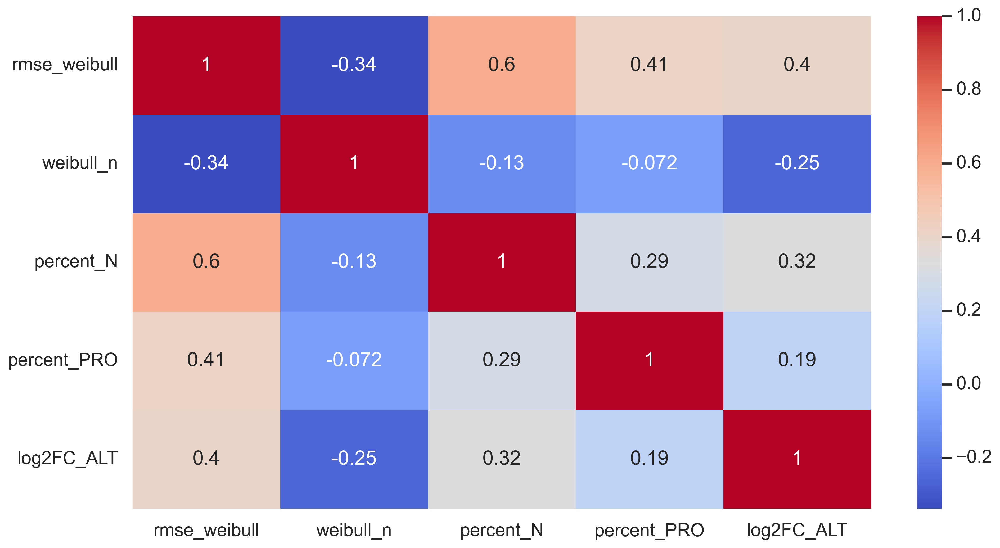

In [50]:
corr_cols = [
    #'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', #'weibull_a', 'weibull_td',
        #'biexp_a1', 'biexp_a2', 'biexp_f',  
  #  'N[PRO] min',
  #      'N[ALT] min', 
  #      'N[Total] min', 
       'percent_N','percent_PRO', 'log2FC_ALT',]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['100']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True, cmap='coolwarm')
plt.show()

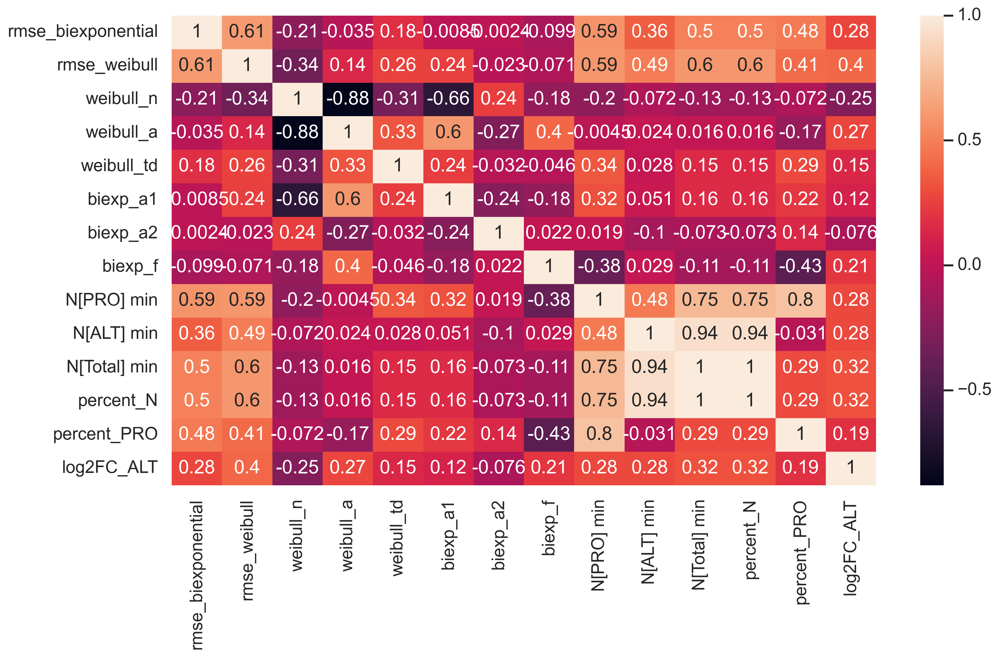

In [51]:
corr_cols = [
    'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', 'weibull_a', 'weibull_td',
        'biexp_a1', 'biexp_a2', 'biexp_f',  'N[PRO] min',
        'N[ALT] min', 
        'N[Total] min', 
       'percent_N','percent_PRO', 'log2FC_ALT', ]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['100']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [52]:
df['1 - rsme']  = 1 - df.rmse_weibull

In [53]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA', 'biexp_a1', 'biexp_a2',
       'biexp_f', 'Unnamed: 0_cap', 'PRO_cap', 'ALT_cap', 'sample_cap',
       'PRO.1', 'ALT.1', 'experiment_cap', 'day', 'culture_cap', 'pair',
       'C[PRO] min', 'C[PRO] max', 'N[PRO] min', 'N[PRO] max', 'C[ALT] min',
       'C[ALT] max', 'N[ALT] min', 'N[ALT] 

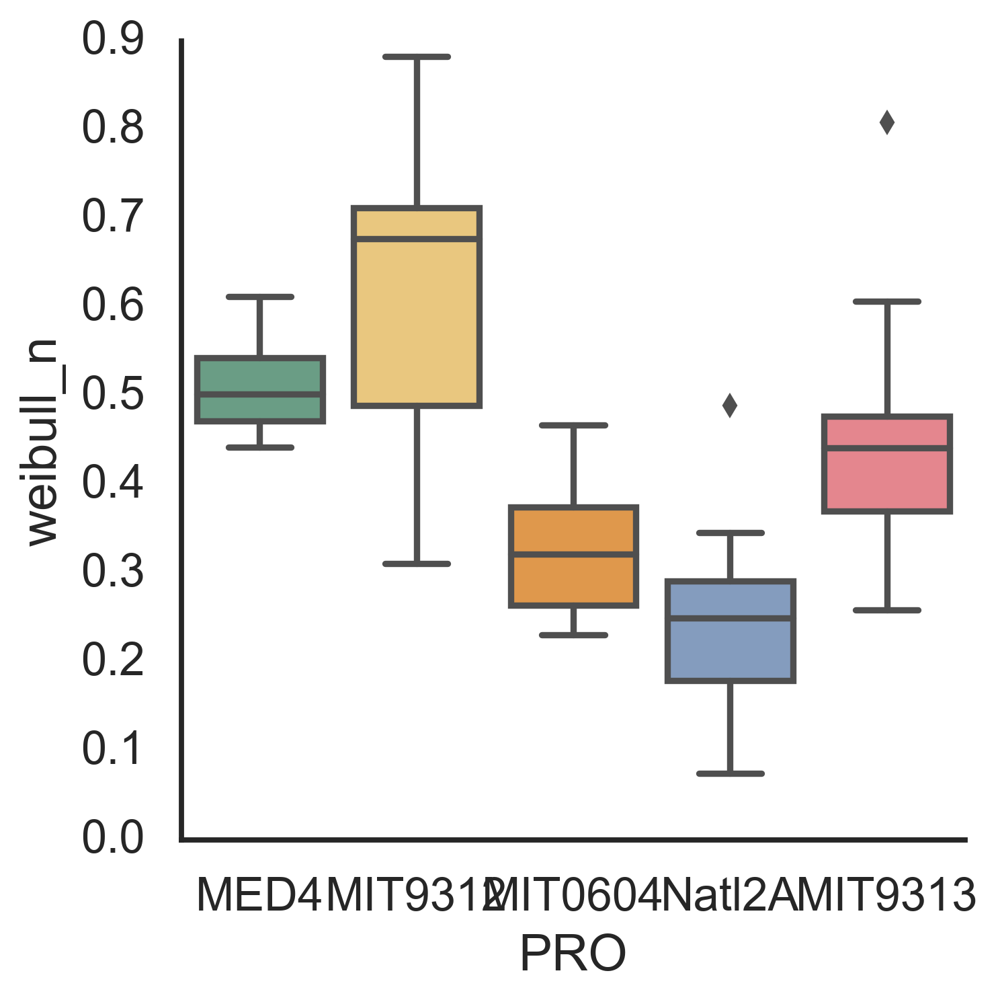

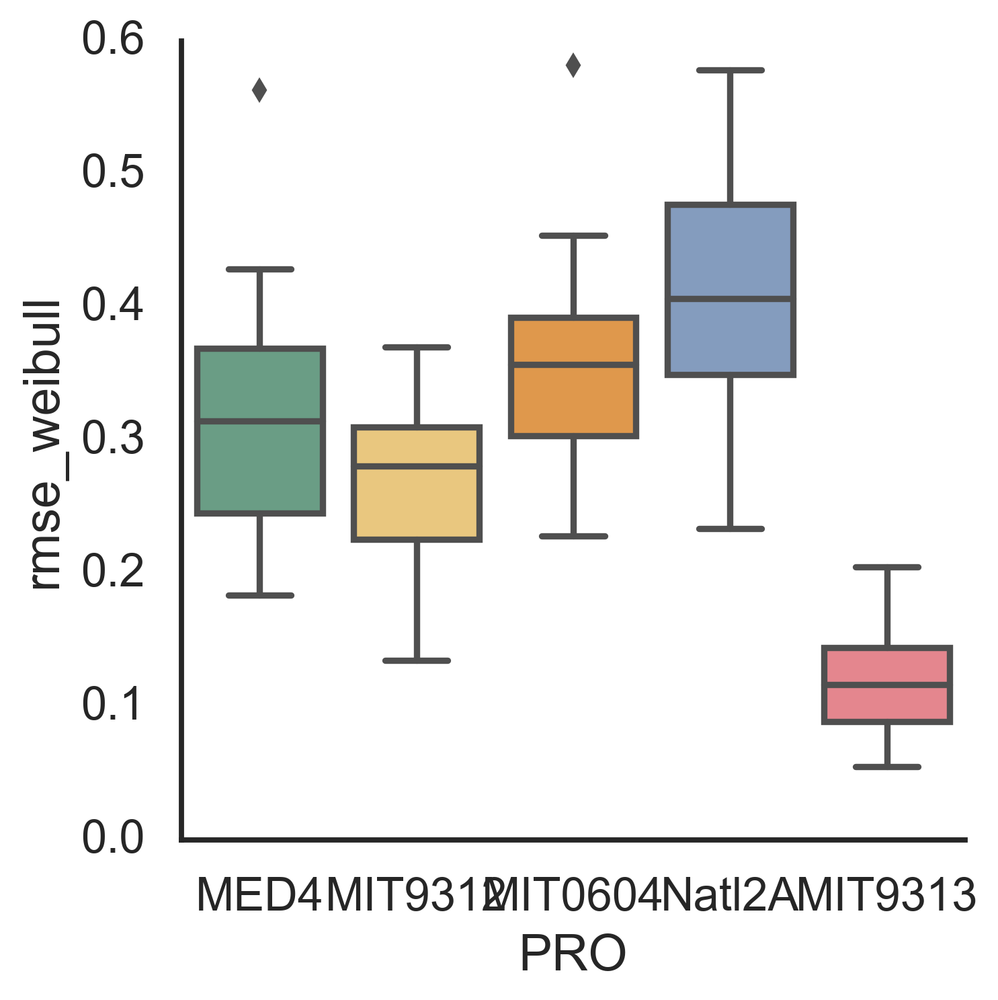

In [54]:
sns.catplot(data=declinedf.loc[declinedf.experiment.isin(['e1']) & 
                             declinedf.culture.isin(['Co_Culture'])],
            x='PRO', y='weibull_n',
            hue='PRO', hue_order=porder, palette=ppallete, 
            order=porder, 
            kind='box',
            dodge=False,
            
           )
sns.catplot(data=declinedf.loc[declinedf.experiment.isin(['e1']) & 
                             declinedf.culture.isin(['Co_Culture'])],
            x='PRO', y='rmse_weibull',
            hue='PRO', hue_order=porder, palette=ppallete, 
            order=porder, 
            kind='box',
            dodge=False,
            
           )



r = 0.64, p = 2.65e-09
r = -0.33, p = 4.83e-03
r = 0.60, p = 2.27e-08
r = -0.13, p = 2.59e-01


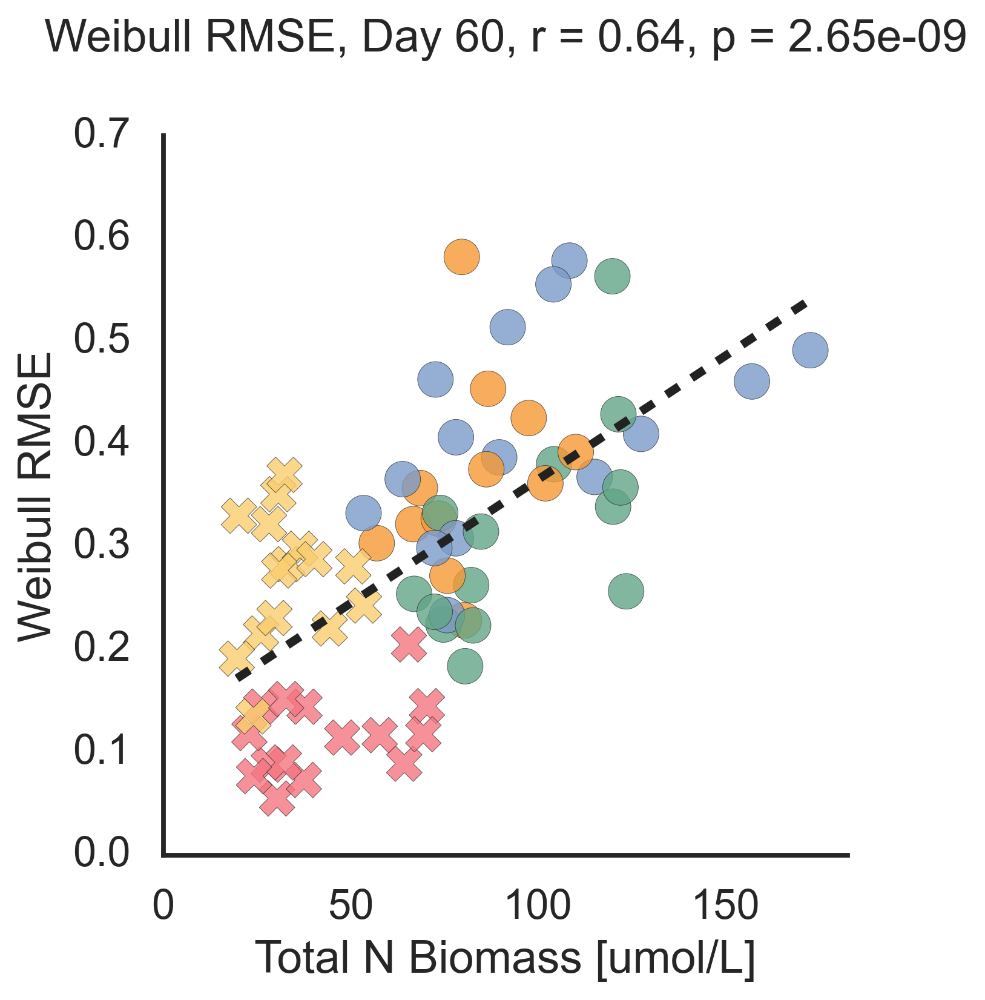

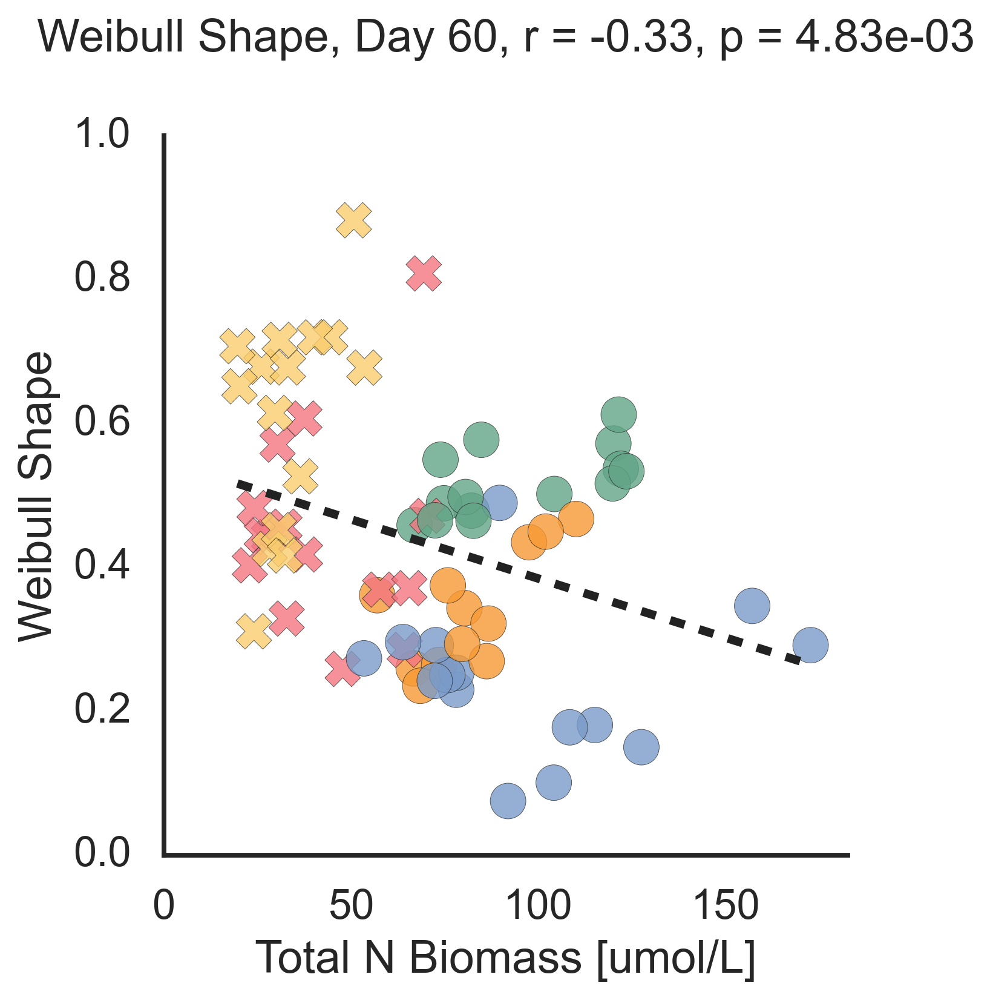

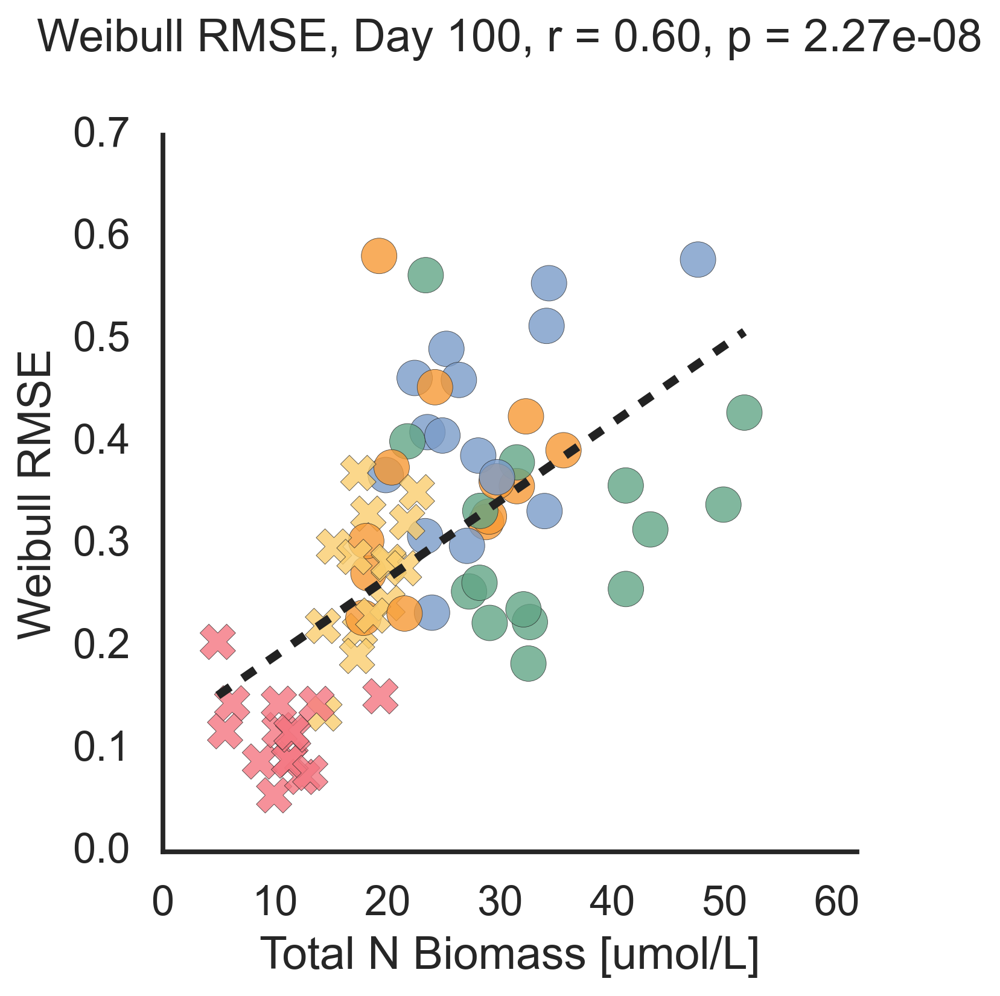

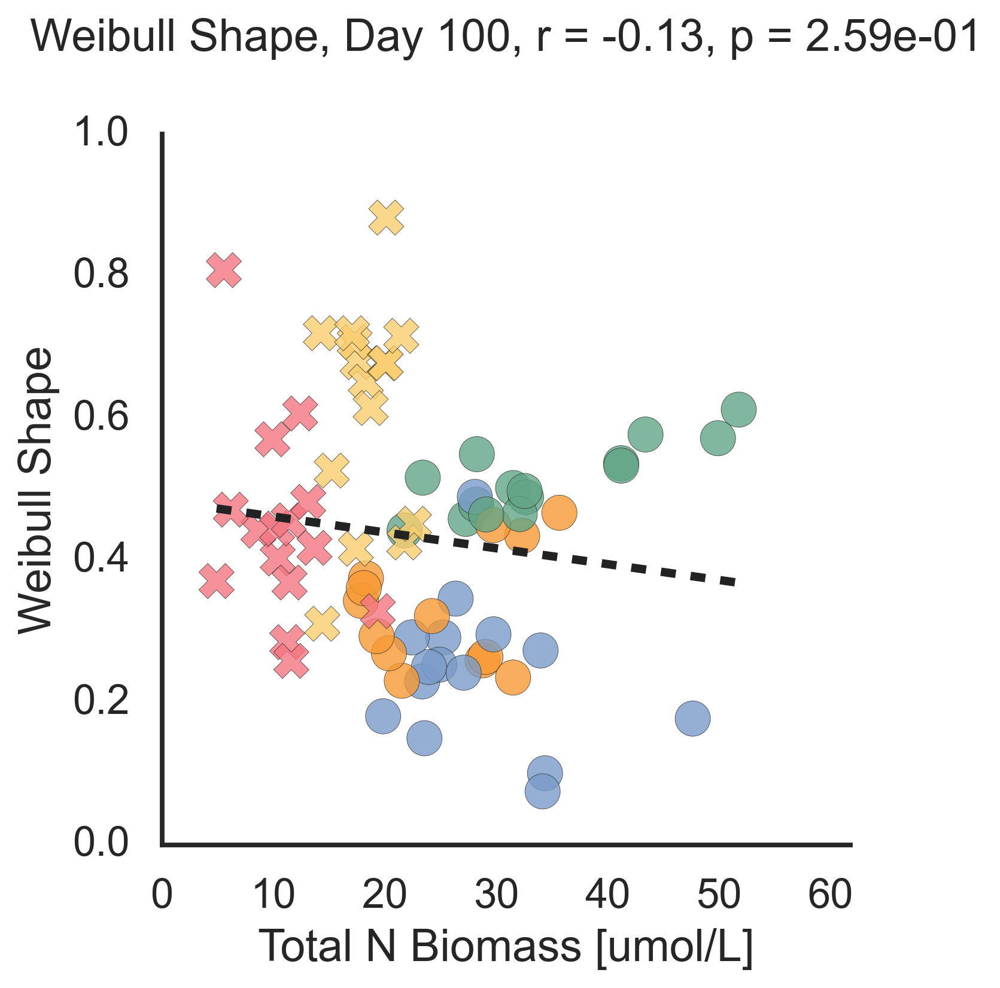

In [55]:
list2way = ['MED4','MIT0604', 'Natl2A']
#             palette=['#1B73D3', '#1bcfd3', PRO_COLOR, ALT_COLOR, ], hue_order=['2-way','1-way', 'PRO Only', 'ALT Only', ],
df['interaction'] = df['culture']
df.loc[df.culture.isin(['Co_Culture'])& df.PRO.isin(['MED4','MIT0604', 'Natl2A']), 'interaction'] = '2-way'
df.loc[df.culture.isin(['Co_Culture'])& ~df.PRO.isin(['MED4','MIT0604', 'Natl2A']), 'interaction'] = '1-way'

for d in ['60', '100']:
    for c,n in [('rmse_weibull', 'Weibull RMSE'), ('weibull_n', 'Weibull Shape')]:

        tdf = df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                     df.culture.isin(['Co_Culture']) #& df.interaction.isin([0])
                                    ]
        ax = sns.relplot(data=tdf, #.loc[tdf.PRO.isin(list2way)],
                        x='N[Total] min',
                        y=c,
                    hue='PRO', hue_order=porder, palette=ppallete, 
                    #style='ALT',  style_order=aorder,markers=amarkers, 
                        s=200,
                             alpha=0.8,
                        edgecolor='#222',linewidth=0.2,
                    style='interaction', 
                        legend=False,
                   )
#         sns.scatterplot(data=tdf.loc[~tdf.PRO.isin(list2way)],
#                         x='N[Total] min',
#                         y=c,
#                     hue='PRO', hue_order=porder, palette=ppallete, 
#                     #style='ALT',  style_order=aorder,markers=amarkers, 
#                         s=100,
#                              alpha=0.8,
#                          edgecolor='#1bcfd3',linewidth=2,
#                         legend=False,
#                    )
        sns.regplot(data=tdf,
                        y=c,
                        x='N[Total] min',
                   #ax=ax,
                   scatter=False, n_boot=10000, 
                         ci=None,
                    line_kws=dict(ls='--'), color='#222'
                  )
        t2 = tdf[[c,'N[Total] min']].dropna()
        r, p = stats.pearsonr(t2[c], t2['N[Total] min'])
        print (f'r = {r:.2f}, p = {p:.2e}')    
#         sns.rugplot(data=tdf,
#                         x='N[Total] min',
#                         y=c,
#                     hue='PRO', hue_order=porder, palette=ppallete, 
#                     legend=False,
#                    )
        plt.xlim(0,tdf['N[Total] min'].max()+10)
        plt.ylabel(n)
        plt.xlabel('Total N Biomass [umol/L]')
        plt.title(f'{n}, Day {d}, r = {r:.2f}, p = {p:.2e}', y=1.1)




Text(0.5, 60.11979166666667, '')

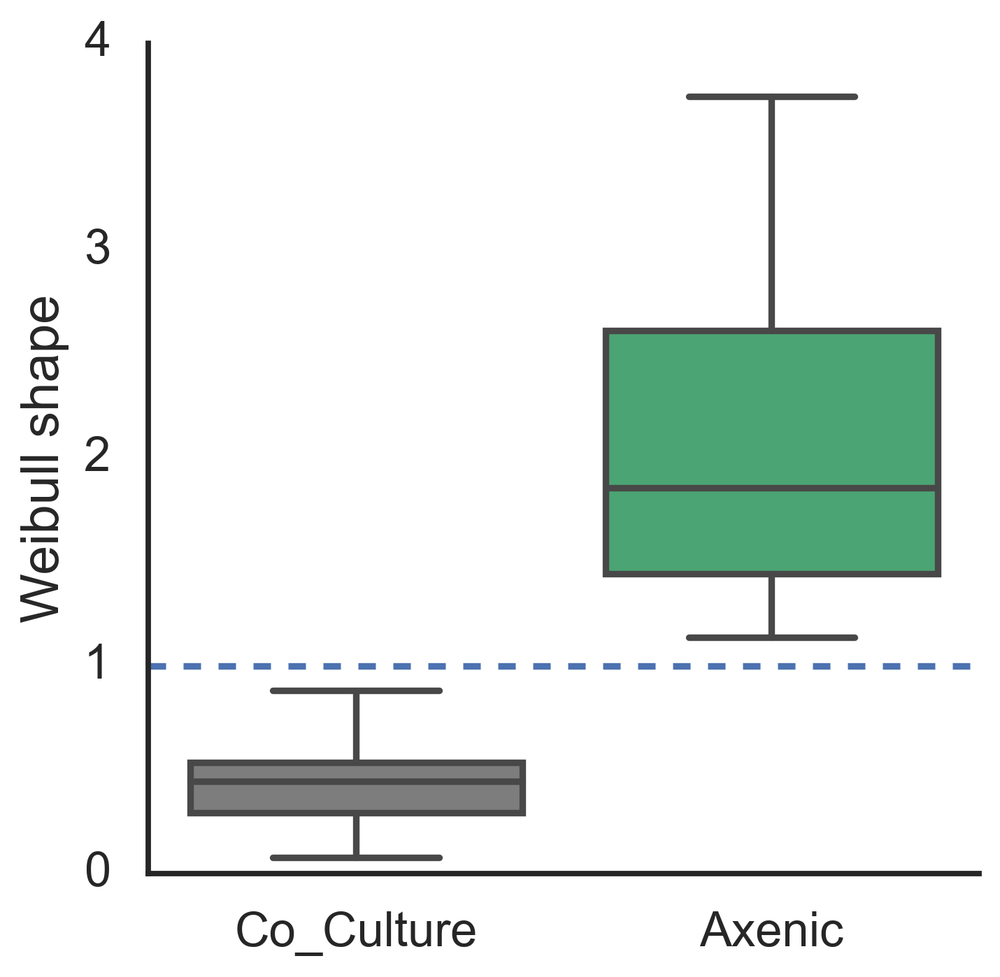

In [56]:
# COCULTURE = '#7D7D7D' # co-culture (grey) #7D7D7D
# CC_COLOR = '#1B73D3'
ax = sns.catplot(data=declinedf.loc[declinedf.experiment.isin(['e1']) & 
                             declinedf.culture.isin(['Co_Culture', 'Axenic']) ],
            y= 'weibull_n', x= 'culture', 
            hue='culture', hue_order=['Co_Culture', 'Axenic'], #palette=ppallete, 
                 #palette=[CC_COLOR, PRO_COLOR],
                 palette=[COCULTURE,
                          PRO_COLOR],
                 kind='box',
                 dodge=False,
           ).set(yticks=[0,1,2,3,4])
plt.axhline(1, ls='--')
plt.ylabel('Weibull shape')
plt.xlabel('')


In [57]:
df.loc[df.experiment.isin(['e1']) &# df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture', 'Axenic']) ]

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,N[Total] max,percent_N,percent_PRO,ALT_percent_increase,log2FC_ALT,PRO1,totalN,ALTN,1 - rsme,interaction
0,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,52.704278,23.289174,18.547208,95.557279,4.492413,MIT0604,28.778765,23.441108,0.677848,2-way
1,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,3.023212,1.659092,90.687897,NaN,NaN,MIT0604,2.050163,0.190913,0.677848,2-way
2,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,123.131667,54.020940,15.880645,33.441650,0.587308,MIT0604,66.754448,56.153411,0.677848,2-way
3,1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.142509,0.5,0.5,...,52.946371,23.504399,20.252794,95.503812,4.475154,MIT0604,29.044722,23.162354,0.672505,2-way
4,1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.142509,0.5,0.5,...,3.110047,1.703838,90.179022,NaN,NaN,MIT0604,2.105456,0.206776,0.672505,2-way
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,84,"e1, 9B",e1,9B,Natl2A,DE,Co_Culture,0.223390,0.5,0.5,...,1.503040,0.719058,46.817244,NaN,NaN,Natl2A,0.888551,0.472556,0.444557,2-way
251,84,"e1, 9B",e1,9B,Natl2A,DE,Co_Culture,0.223390,0.5,0.5,...,182.647093,84.300786,34.327083,45.368555,0.872197,Natl2A,104.171686,68.412585,0.444557,2-way
252,85,"e1, 9C",e1,9C,Natl2A,DE,Co_Culture,0.234706,0.5,0.5,...,58.283016,27.657601,44.032468,94.555494,4.199055,Natl2A,34.176893,19.127963,0.486244,2-way
253,85,"e1, 9C",e1,9C,Natl2A,DE,Co_Culture,0.234706,0.5,0.5,...,2.405815,1.246003,72.913033,NaN,NaN,Natl2A,1.539704,0.417059,0.486244,2-way


In [58]:
capdf.columns

Index(['Unnamed: 0', 'PRO', 'ALT', 'sample', 'PRO.1', 'ALT.1', 'experiment',
       'day', 'culture', 'pair', 'C[PRO] min', 'C[PRO] max', 'N[PRO] min',
       'N[PRO] max', 'C[ALT] min', 'C[ALT] max', 'N[ALT] min', 'N[ALT] max',
       'C[Total] min', 'C[Total] max', 'N[Total] min', 'N[Total] max',
       'percent_N', 'percent_PRO', 'ALT_percent_increase', 'log2FC_ALT',
       'PRO1', 'totalN', 'ALTN', 'experiment_sample'],
      dtype='object')

In [59]:
capdf['replicate'] = capdf['sample'].astype(str).str[-1:]

PRO                     MED4   MIT9312   MIT0604    Natl2A   MIT9313
day ALT  replicate                                                  
60  DE   A          0.802700 -0.850263  0.587308  0.947641 -1.015041
         B          0.977940 -0.693039  0.718190  0.872197 -0.237529
         C          0.984488 -0.622709  0.635613  0.694132 -0.494867
    DE1  A          1.917394 -0.550258  1.897633  1.558132  0.255255
         B          1.770836 -2.542814  1.807677  2.159509 -0.000821
         C          2.082358 -0.778492  1.394141  2.297310  0.183228
    1A3  A          1.910686  0.534467  1.546104  0.495336  0.687759
         B          2.148579  0.391313  1.559327  0.956886  0.621031
         C               NaN  0.010617  1.463126  0.764239  0.573418
    ATCC A          2.019807  0.258808       NaN  1.511921  1.609468
         B          2.612997  0.434099       NaN  1.502168  1.173110
         C          1.819302  0.530434       NaN  1.347067  1.475811
    BS11 A          0.778238 -1.733428  0.678632  0.859718 -1.521877
         B          0.792320 -0.693369  0.502635  0.737480 -1.103222
         C          0.832482 -0.560414  0.552520 -0.176206 -1.237893
100 DE   A          4.606828  3.608873  4.492413  4.641803  3.319787
         B          4.692425  3.651569  4.475154  4.161870  3.303497
         C          4.398778  3.391668  4.635431  4.199055  3.844626
    DE1  A          2.122892  1.383127  1.666423  1.884148  0.585413
         B          2.097166  1.553802  1.719194  1.819110  0.811384
         C          2.021222  1.502026  1.683501  1.904679  0.701324
    1A3  A          5.083789  3.722746  4.426130  4.920860  2.540735
         B          4.613384  3.944643  4.640855  4.345164  2.468980
         C          4.303301  4.137013  4.299326  4.612456  2.262130
    ATCC A          3.236180  1.832031       NaN  2.078789  1.560577
         B          3.171249  1.910386       NaN  2.031005  1.634151
         C          2.800695  1.599402  2.575116  2.160041  1.532888
    BS11 A          1.732171 -0.085412  1.447542  0.524350 -0.301966
         B          1.776806  0.263047  1.235894  0.554414 -0.035894
         C          1.130928  0.281482  1.088828  0.584592 -0.280085

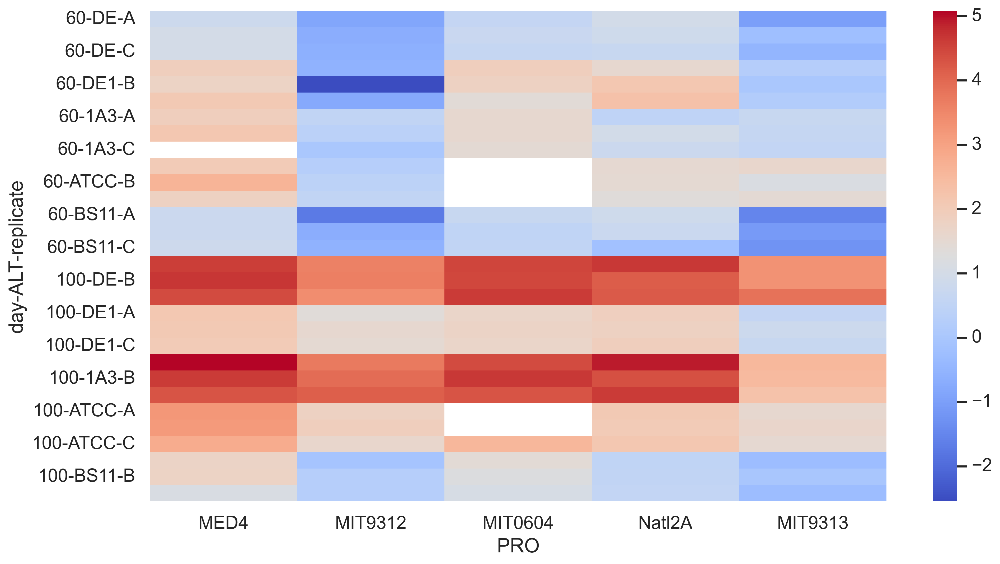

In [60]:
#capdf.groupby(['PRO', 'ALT'])
t= capdf.loc[capdf.experiment.isin(['exp1']) & 
             
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.ALT_percent_increase < -30)
         ].pivot_table(values='log2FC_ALT', columns=['PRO'], index=['day', 'ALT', 'replicate'])
t = t.reindex(columns=porder)
t = t.reindex(index=['60', '100'], level=0)
t = t.reindex(index=aorder, level=1)

sns.heatmap(t.clip(lower=-50), cmap='coolwarm', #annot=True,  fmt='.0f'
           )
t

In [61]:
capdf.log2FC_ALT.describe()

count    172.000000
mean       1.233599
std        1.950330
min      -10.912266
25%        0.244243
50%        0.967413
75%        2.042951
max        5.083789
Name: log2FC_ALT, dtype: float64

In [62]:
sns.color_palette('cividis')

[(0.130669, 0.231458, 0.43284),
 (0.298421, 0.332247, 0.423973),
 (0.42512, 0.431334, 0.447692),
 (0.555393, 0.537807, 0.471147),
 (0.695985, 0.648334, 0.440072),
 (0.849223, 0.771947, 0.359729)]

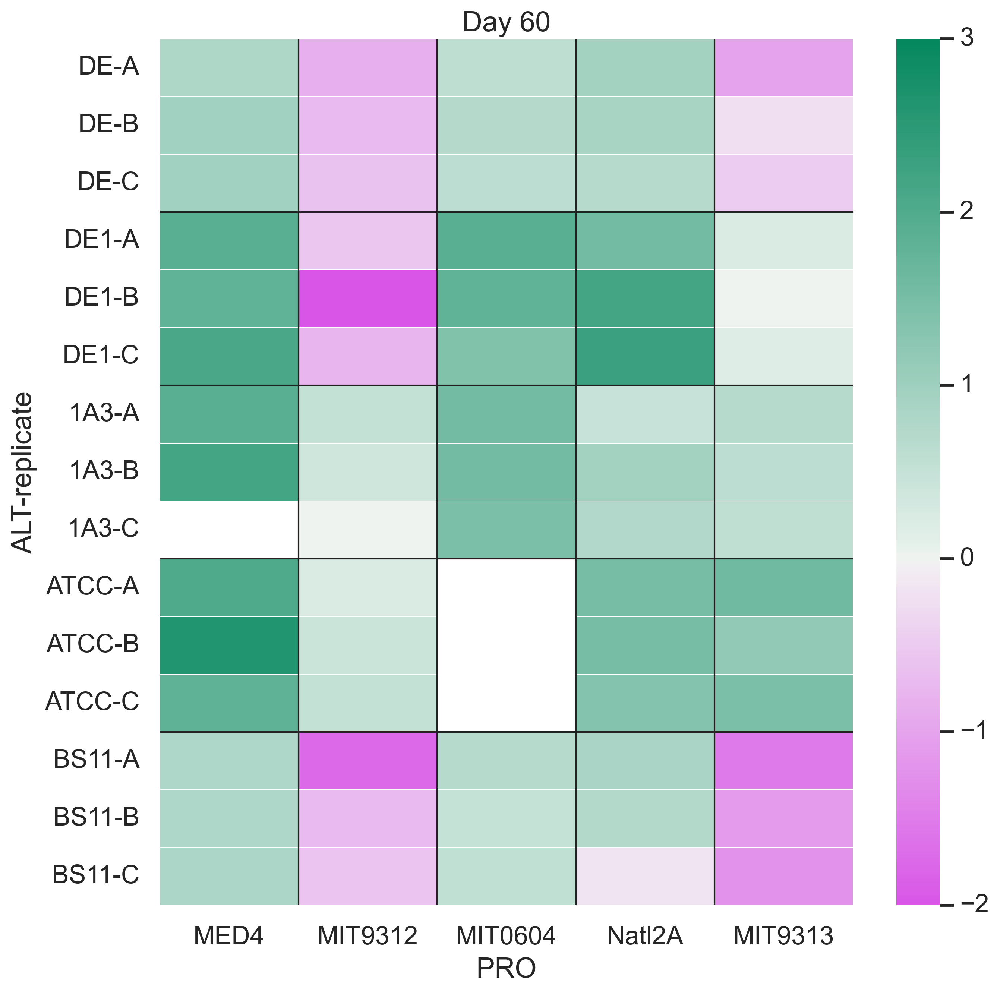

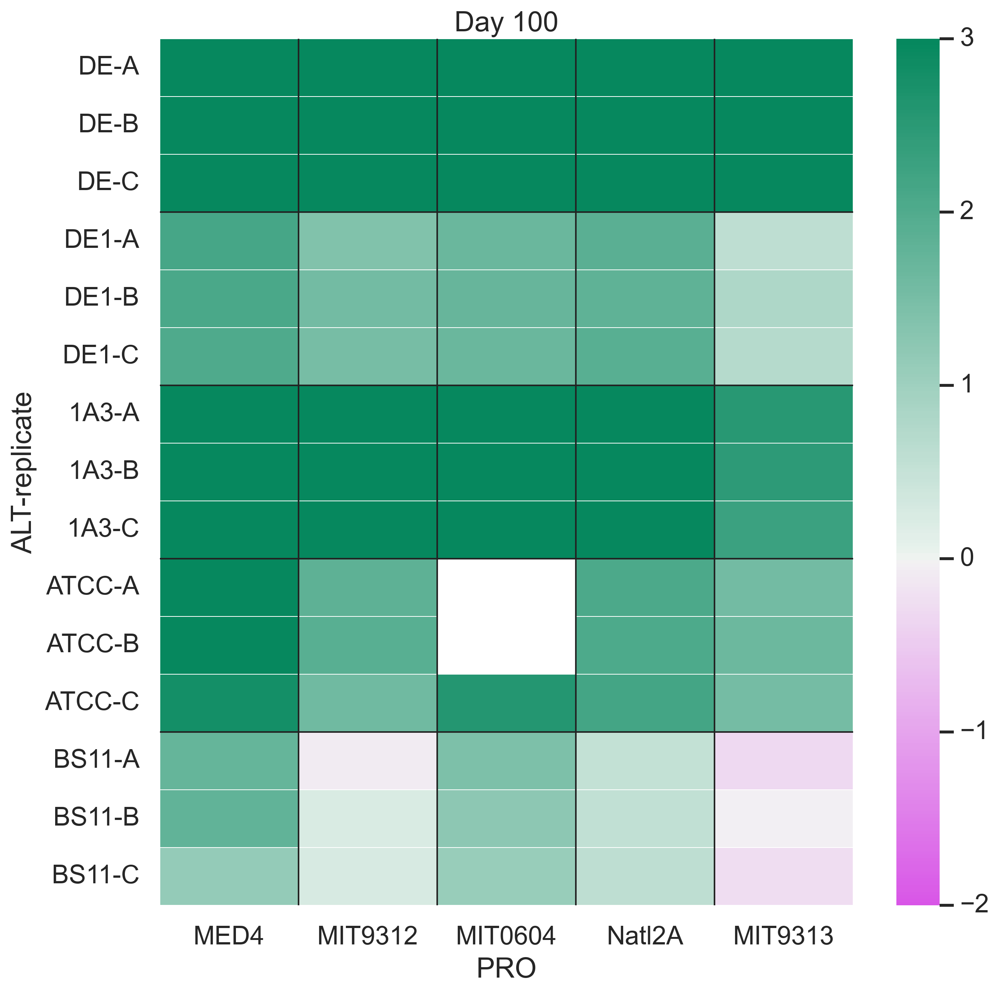

In [91]:
#capdf.groupby(['PRO', 'ALT'])
pal = sns.diverging_palette(300,150,  s=99, l=50,  as_cmap=True)
#pal = sns.diverging_palette(5,250, s=99, l=50,
#                                  n=9, as_cmap=True)
#pal = 'PiYG'
for d in ['60', '100']:
    t= capdf.loc[capdf.experiment.isin(['exp1']) & 

              capdf.culture.isin(['Co_Culture']) & 
              capdf.day.isin([d]) #&
            #(capdf.ALT_percent_increase < -30)
             ].pivot_table(values='log2FC_ALT', columns=['PRO'], index=['ALT', 'replicate'])
    t = t.reindex(columns=porder)
    #t = t.reindex(index=['60', '100'], level=0)
    t = t.reindex(index=aorder, level=0)

    plt.subplots(figsize=(10,10))
    sns.heatmap(t, cmap=pal, #annot=True,  
                fmt='.0f', square=False, vmin=-2, vmax=3, center=0,
                linewidth=0.01,  # Add gridlines
               # linecolor="#222",# Adjust gridline color
                linecolor="white",# Adjust gridline color
               )
    plt.title(f'Day {d}')
    for r in [3,6,9,12]:
        plt.axhline(r, lw=1, c='#222')
    for r in [1,2,3,4]:
        plt.axvline(r, lw=1, c='#222')
    #plt.yticks(aorder)
    plt.show()


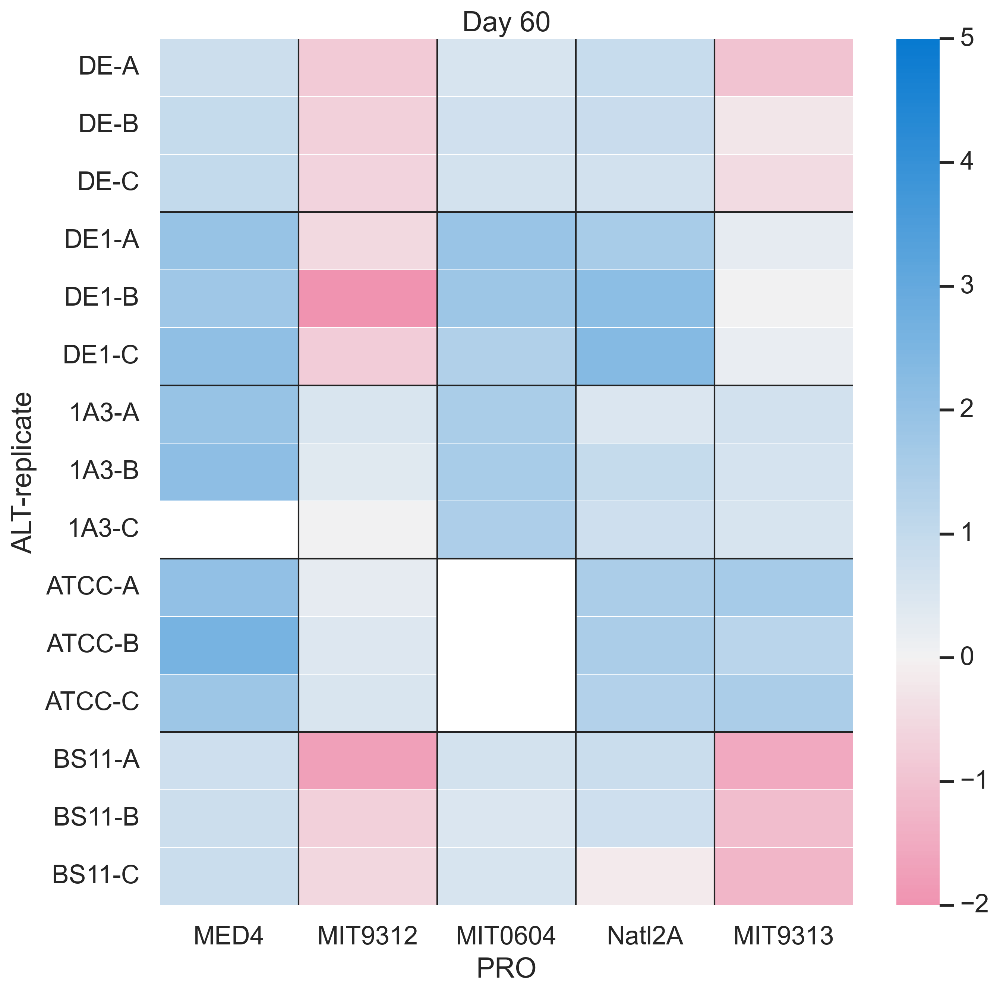

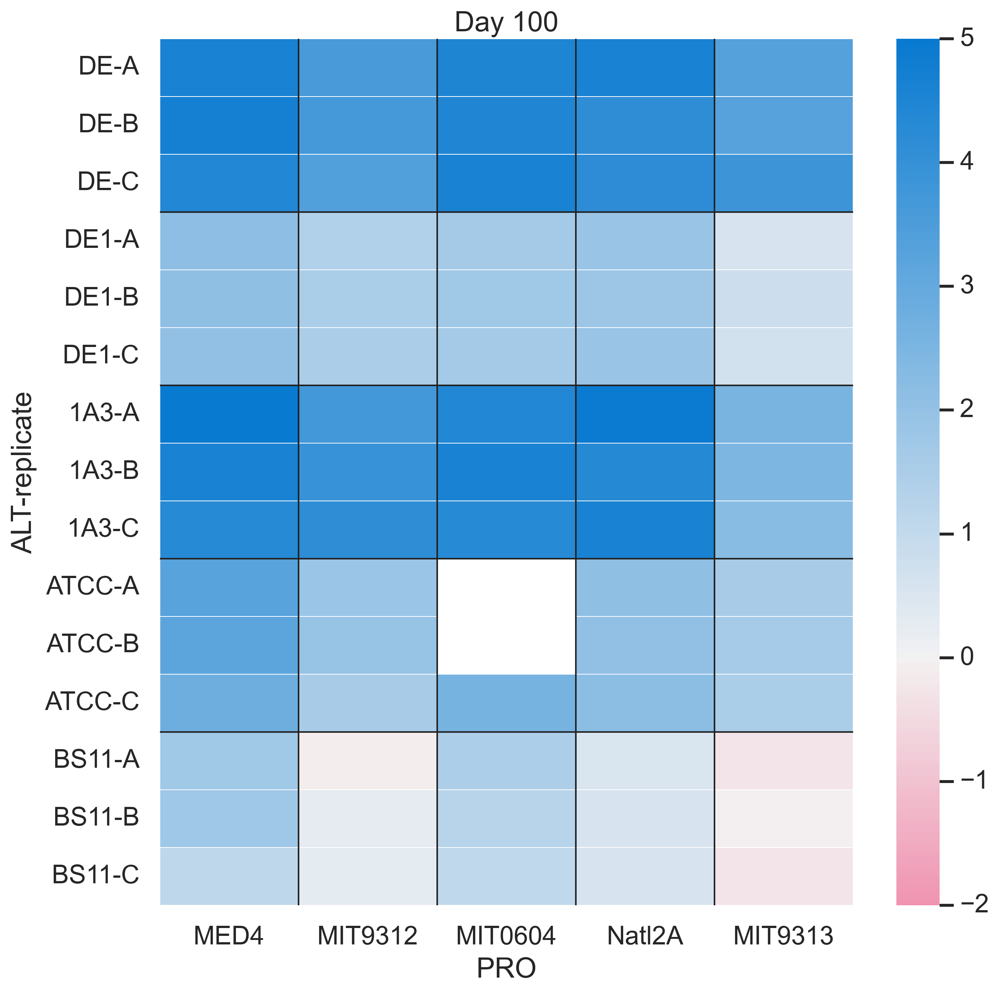

In [63]:
#capdf.groupby(['PRO', 'ALT'])
pal = sns.diverging_palette(275,150,  s=99, l=50,  as_cmap=True)
pal = sns.diverging_palette(5,250, s=99, l=50,
                                  n=9, as_cmap=True)
for d in ['60', '100']:
    t= capdf.loc[capdf.experiment.isin(['exp1']) & 

              capdf.culture.isin(['Co_Culture']) & 
              capdf.day.isin([d]) #&
            #(capdf.ALT_percent_increase < -30)
             ].pivot_table(values='log2FC_ALT', columns=['PRO'], index=['ALT', 'replicate'])
    t = t.reindex(columns=porder)
    #t = t.reindex(index=['60', '100'], level=0)
    t = t.reindex(index=aorder, level=0)

    plt.subplots(figsize=(10,10))
    sns.heatmap(t, cmap=pal, #annot=True,  
                fmt='.0f', square=False, vmin=-2, vmax=5, center=0,
                linewidth=0.01,  # Add gridlines
               # linecolor="#222",# Adjust gridline color
                linecolor="white",# Adjust gridline color
               )
    plt.title(f'Day {d}')
    for r in [3,6,9,12]:
        plt.axhline(r, lw=1, c='#222')
    for r in [1,2,3,4]:
        plt.axvline(r, lw=1, c='#222')
    #plt.yticks(aorder)
    plt.show()


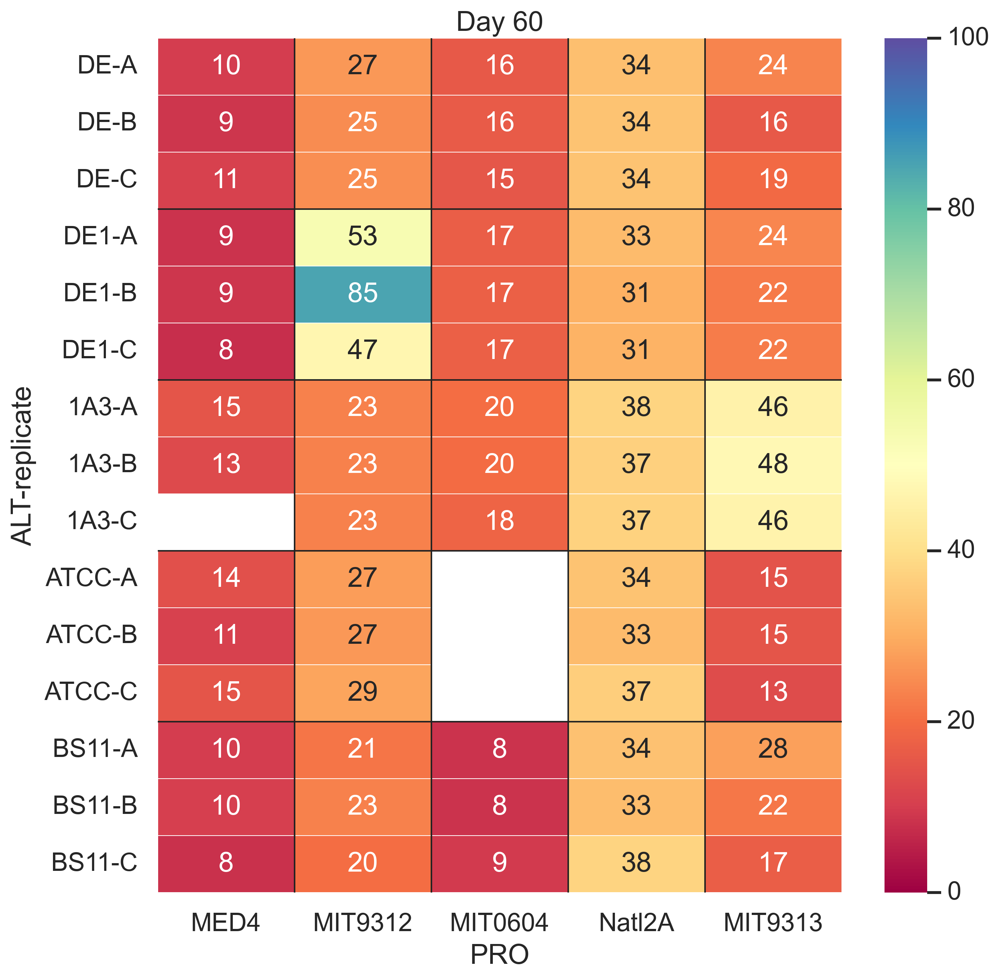

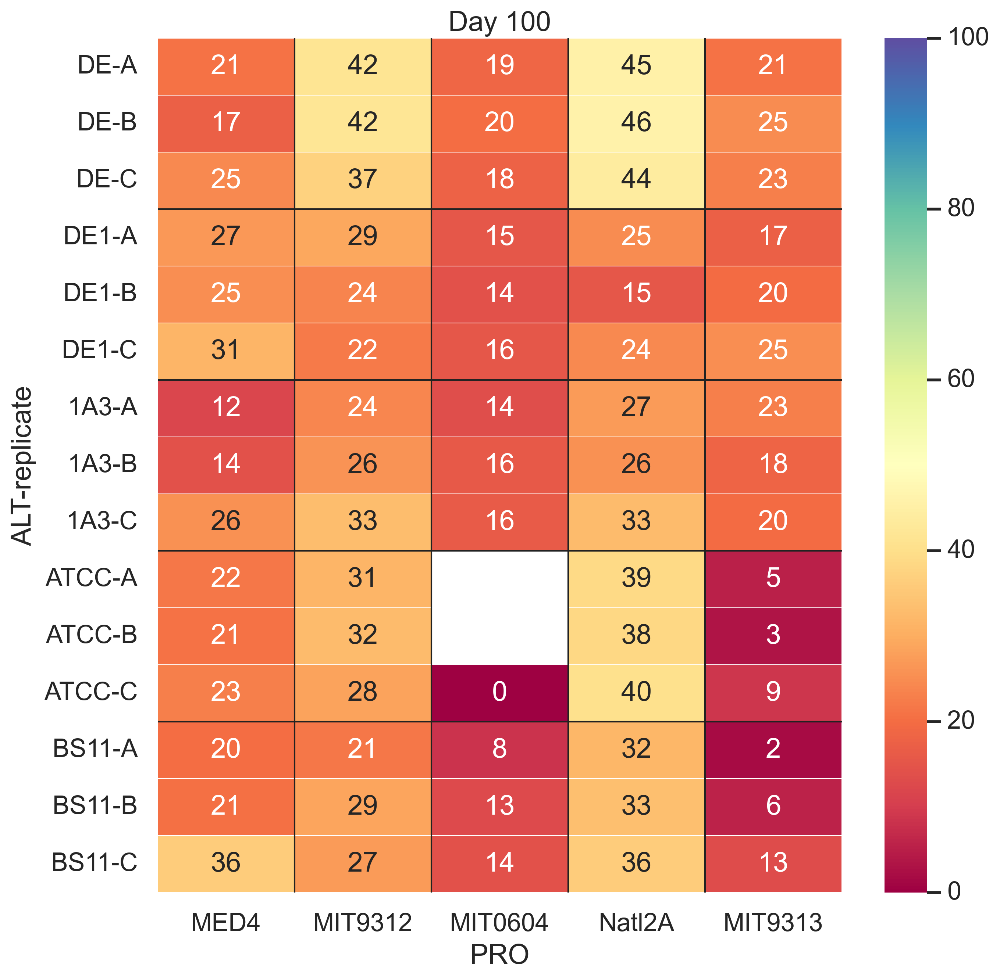

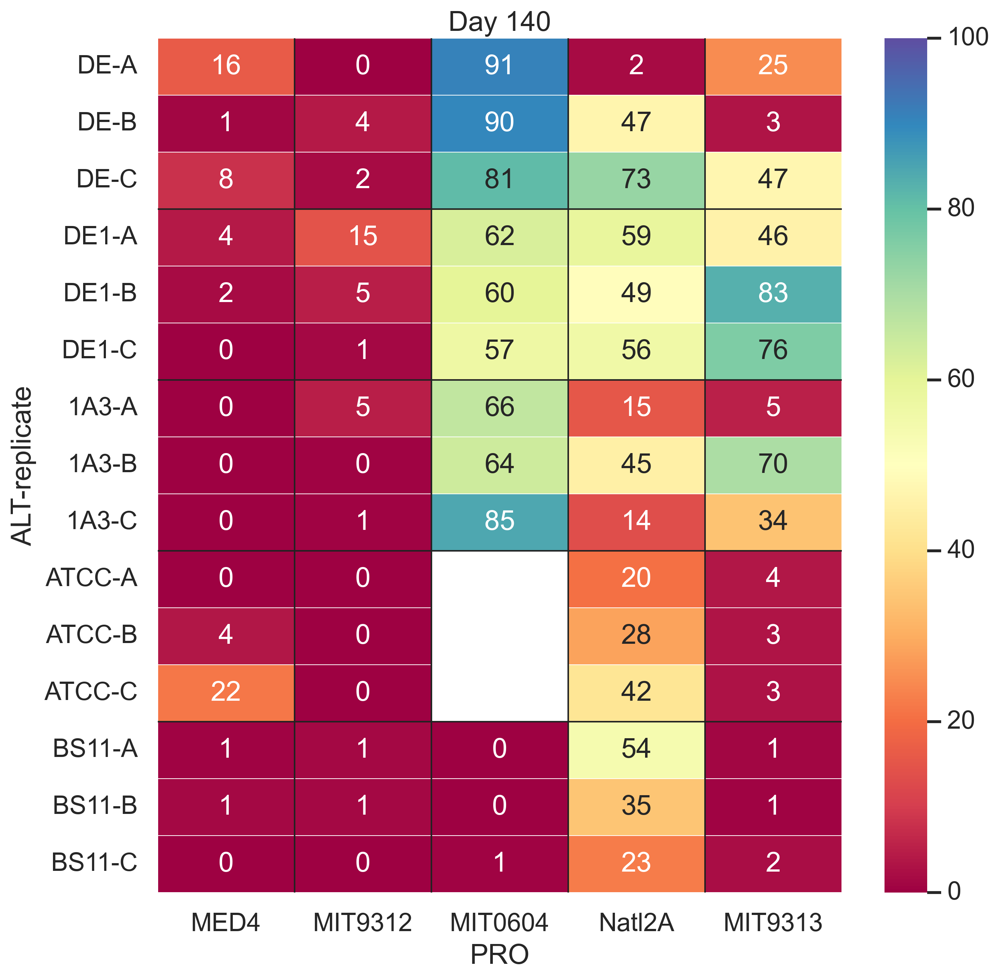

In [84]:
#capdf.groupby(['PRO', 'ALT'])
pal = sns.diverging_palette(275,150,  s=99, l=50,  as_cmap=True)
#pal = sns.diverging_palette(5,250, s=99, l=50,
#                                  n=9, as_cmap=True)
pal='Spectral'
for d in ['60', '100', '140']:
    t= capdf.loc[capdf.experiment.isin(['exp1']) & 

              capdf.culture.isin(['Co_Culture']) & 
              capdf.day.isin([d]) #&
            #(capdf.ALT_percent_increase < -30)
             ].pivot_table(values='percent_PRO', columns=['PRO'], index=['ALT', 'replicate'])
    t = t.reindex(columns=porder)
    #t = t.reindex(index=['60', '100'], level=0)
    t = t.reindex(index=aorder, level=0)

    plt.subplots(figsize=(10,10))
    sns.heatmap(t, cmap=pal, annot=True,  
                fmt='.0f', square=False, vmin=0, vmax=100, #center=0,
                linewidth=0.01,  # Add gridlines
               # linecolor="#222",# Adjust gridline color
                linecolor="white",# Adjust gridline color
               )
    plt.title(f'Day {d}')
    for r in [3,6,9,12]:
        plt.axhline(r, lw=1, c='#222')
    for r in [1,2,3,4]:
        plt.axvline(r, lw=1, c='#222')
    #plt.yticks(aorder)
    plt.show()


In [64]:
for d in df.day.unique():
    mean_alt = df.loc[df['day'].isin([d]) & df['culture'].isin(['ALT Only'])].groupby('ALT')['N[ALT] min'].mean()
    df.loc[df['day'].isin([d]) ,'ALT_percent_increase'] = 100* (df.loc[df['day'].isin([d]),'N[ALT] min']  - df.loc[df['day'].isin([d]) ,'ALT'].map(mean_alt)) / df.loc[df['day'].isin([d]),'N[ALT] min']
    df.loc[df['day'].isin([d]) ,'log2FC_ALT'] = np.log2(df.loc[df['day'].isin([d]),'N[ALT] min'])  - np.log2(df.loc[df['day'].isin([d]) ,'ALT'].map(mean_alt))
    

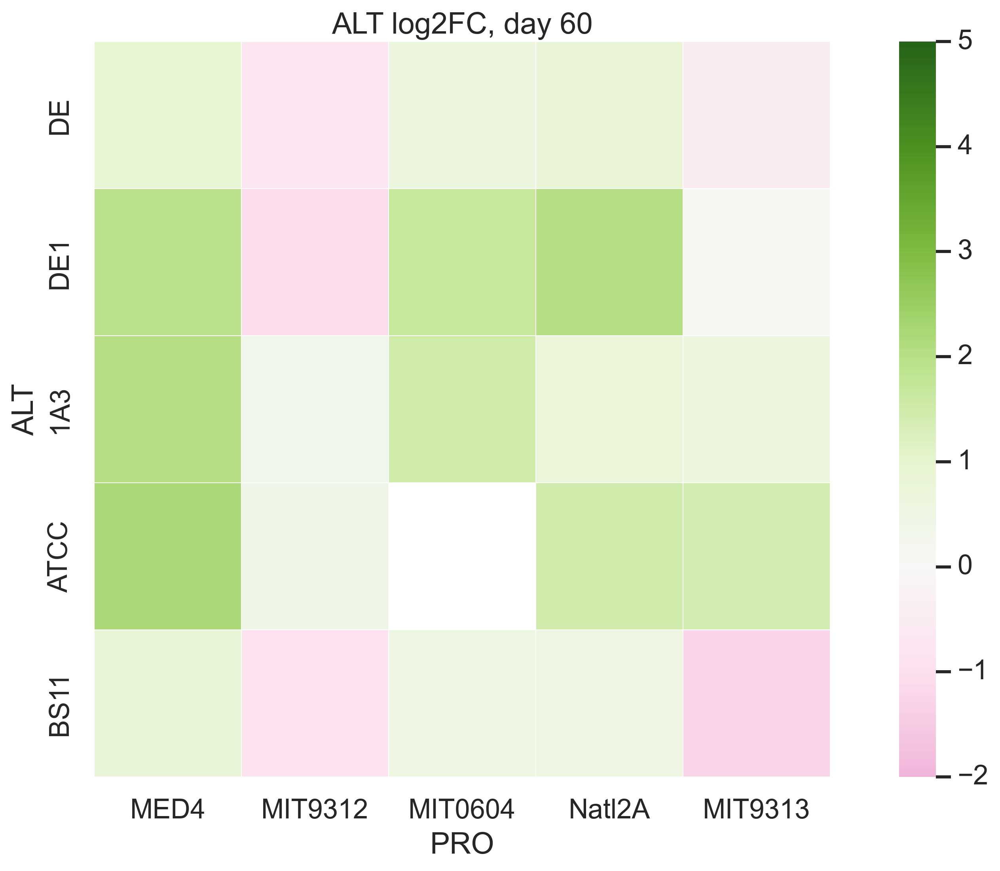

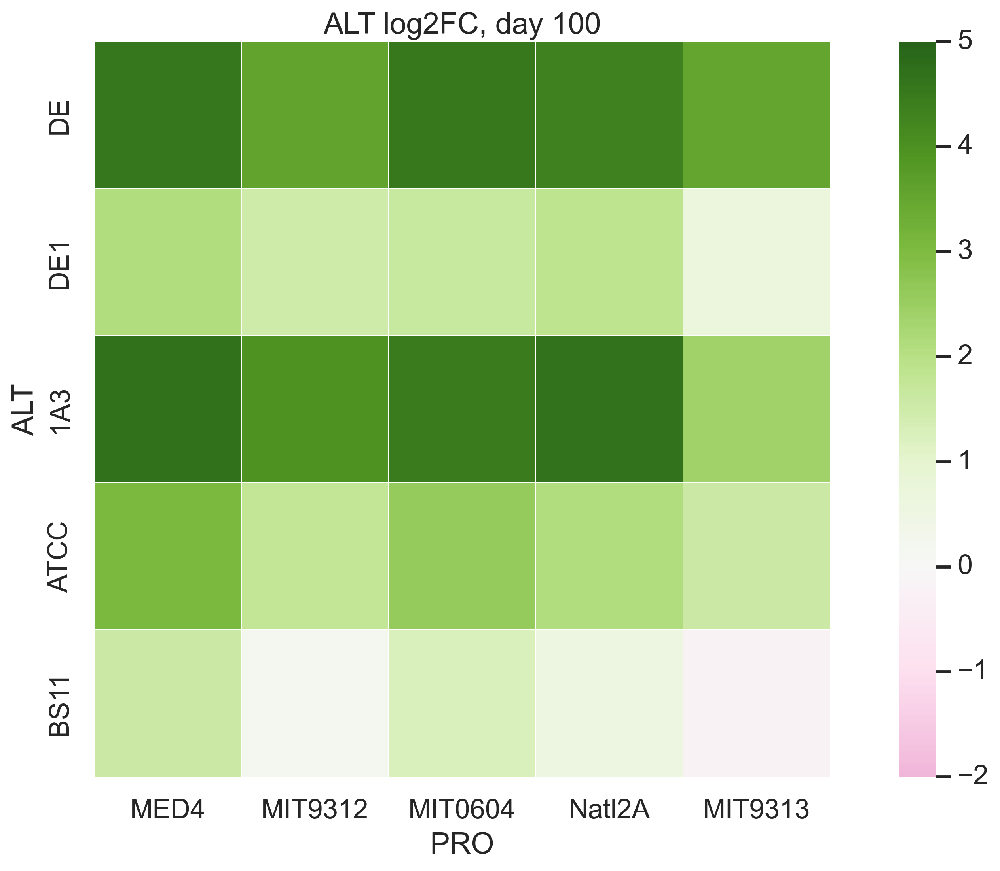

day         100                                                60            \
PRO        MED4   MIT0604   MIT9312   MIT9313    Natl2A      MED4   MIT0604   
count  5.000000  5.000000  5.000000  5.000000  5.000000  5.000000  4.000000   
mean   3.202415  2.905699  2.186075  1.603738  2.702393  1.576075  1.116821   
std    1.418196  1.529794  1.558644  1.448437  1.744542  0.659335  0.586618   
min    1.575141  1.264979  0.162626 -0.200849  0.554662  0.801197  0.579845   
25%    2.081069  1.689874  1.481408  0.702320  1.869771  0.924132  0.631001   
50%    3.081736  2.575116  1.786548  1.576508  2.090932  1.929148  1.085765   
75%    4.571206  4.462383  3.555113  2.428711  4.351236  2.034530  1.571585   
max    4.702924  4.536140  3.944680  3.512000  4.645363  2.191366  1.715910   

day                                  
PRO     MIT9312   MIT9313    Natl2A  
count  5.000000  5.000000  5.000000  
mean  -0.389794  0.076805  1.125836  
std    0.705072  1.044739  0.613341  
min   -1.061419 -1.277301  0.541671  
25%   -0.909370 -0.547483  0.751103  
50%   -0.718899  0.149866  0.841859  
75%    0.328599  0.628167  1.455670  
max    0.412120  1.430778  2.038876

In [65]:
#capdf.groupby(['PRO', 'ALT'])
mean_alt_cc= capdf.loc[capdf.experiment.isin(['exp1']) & 
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.ALT_percent_increase < -30)
         ].groupby(['day','ALT', 'PRO'])['N[ALT] min'].mean().reset_index()
mean_alt_axenic = capdf.loc[capdf.experiment.isin(['exp1']) & 
          capdf.culture.isin(['ALT Only']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.ALT_percent_increase < -30)
         ].groupby(['day','ALT', 'PRO'])['N[ALT] min'].mean().reset_index()
t = pd.merge(mean_alt_cc, mean_alt_axenic, on=['ALT', 'day'], suffixes=['', '_axenic'])
t.groupby(['day','ALT']).describe().T
t.columns

t['log2FC_ALT'] = np.log2(t['N[ALT] min']) - np.log2(t['N[ALT] min_axenic']) 
for d in ['60', '100']:
    pt = t.loc[t.day.isin([d])].pivot_table(values='log2FC_ALT', columns=['ALT'], 
                           index=[ 'PRO', ], aggfunc='mean')
    pt = pt.reindex(columns=aorder)
    pt = pt.reindex(index=porder)
    sns.heatmap(pt.T, #cmap='coolwarm_r', 
                cmap='PiYG', #annot=True,  
                #cmap='Spectral', #annot=True,  
                fmt='.0f', square=True, vmin=-2, vmax=5,
                center=0,
                linewidth=0.01,  # Add gridlines
               # linecolor="#222",# Adjust gridline color
                linecolor="white",# Adjust gridline color
               )
    plt.title(f'ALT log2FC, day {d}')

    #sns.heatmap(pt, cmap='coolwarm', annot=True,  fmt='.1f')
    plt.show()    
t.groupby(['day','PRO'])['log2FC_ALT'].describe().T


In [66]:
t.loc[t.PRO.isin(['MED4','MIT0604', 'Natl2A'])].groupby('day')['log2FC_ALT'].describe().T

day,100,60
count,15.000000,14.000000
mean,2.936836,1.284060
std,1.469019,0.616405
min,0.554662,0.541671
25%,1.779823,0.763627
50%,2.575116,1.189901
75%,4.499261,1.875839
max,4.702924,2.191366


In [67]:
t.loc[~t.PRO.isin(['MED4','MIT0604', 'Natl2A'])].groupby('day')['log2FC_ALT'].describe().T

day,100,60
count,10.000000,10.000000
mean,1.894907,-0.156494
std,1.451327,0.875513
min,-0.200849,-1.277301
25%,0.897092,-0.861752
50%,1.681528,-0.198808
75%,3.241178,0.391240
max,3.944680,1.430778


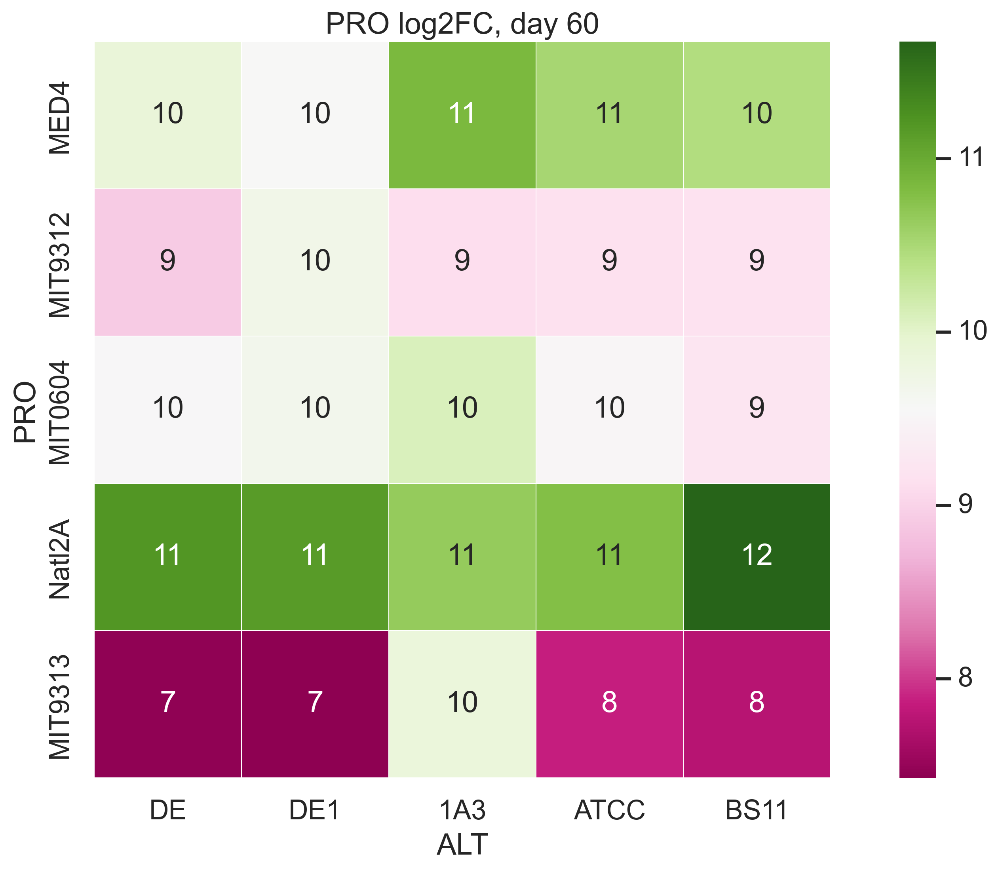

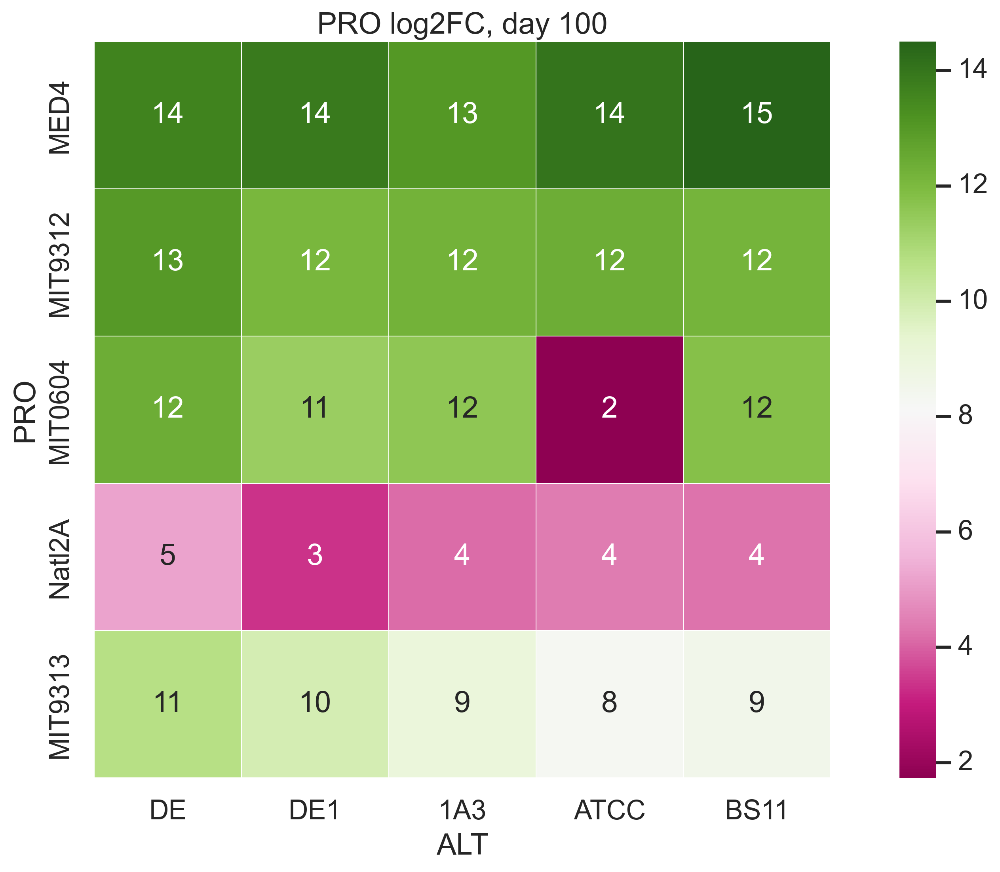

day,100,60
count,25.000000,25.000000
mean,9.904690,9.646452
std,3.846993,1.158414
min,1.736966,7.429922
25%,8.286087,9.149515
50%,11.566743,9.674737
75%,12.403432,10.520827
max,14.501893,11.675792


In [68]:
#capdf.groupby(['PRO', 'PRO'])
mean_PRO_cc= capdf.loc[capdf.experiment.isin(['exp1']) & 
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.PRO_percent_increase < -30)
         ].groupby(['day','PRO', 'ALT'])['N[PRO] min'].mean().reset_index()
mean_PRO_axenic = capdf.loc[capdf.experiment.isin(['exp1']) & 
          capdf.culture.isin(['PRO Only']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.PRO_percent_increase < -30)
         ].groupby(['day','PRO', 'ALT'])['N[PRO] min'].mean().reset_index()
t = pd.merge(mean_PRO_cc, mean_PRO_axenic, on=['PRO', 'day'], suffixes=['', '_axenic'])
t.groupby(['day','PRO']).describe().T
t.columns
t['log2FC_PRO'] = np.log2(t['N[PRO] min']) - np.log2(t['N[PRO] min_axenic']) 
for d in ['60', '100']:
    pt = t.loc[t.day.isin([d])].pivot_table(values='log2FC_PRO', columns=['ALT'], 
                           index=[ 'PRO', ], aggfunc='mean')
    pt = pt.reindex(columns=aorder)
    pt = pt.reindex(index=porder)
    sns.heatmap(pt, #cmap='coolwarm_r', 
                cmap='PiYG', annot=True,  
                fmt='.0f', square=True, #vmin=-5, vmax=5,
                linewidth=0.01,  # Add gridlines
               # linecolor="#222",# Adjust gridline color
                linecolor="white",# Adjust gridline color
               )
    plt.title(f'PRO log2FC, day {d}')

    #sns.heatmap(pt, cmap='coolwarm', annot=True,  fmt='.1f')
    plt.show()    
t.groupby(['day'])['log2FC_PRO'].describe().T


In [69]:
t

,day,PRO,ALT,N[PRO] min,ALT_axenic,N[PRO] min_axenic,log2FC_PRO
0,100,MED4,1A3,4.236650,PRO Only,0.000513,13.010474
1,100,MED4,ATCC,8.526817,PRO Only,0.000513,14.019557
2,100,MED4,BS11,11.911996,PRO Only,0.000513,14.501893
3,100,MED4,DE,6.506969,PRO Only,0.000513,13.629536
4,100,MED4,DE1,7.755416,PRO Only,0.000513,13.882754
5,100,MIT0604,1A3,3.234719,PRO Only,0.001066,11.566743
6,100,MIT0604,ATCC,0.003555,PRO Only,0.001066,1.736966
7,100,MIT0604,BS11,3.764810,PRO Only,0.001066,11.785680
8,100,MIT0604,DE,5.621117,PRO Only,0.001066,12.363959
9,100,MIT0604,DE1,2.727796,PRO Only,0.001066,11.320838


In [70]:
#capdf.groupby(['PRO', 'ALT'])
t= capdf.loc[capdf.experiment.isin(['exp1']) & 
             
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.ALT_percent_increase < -30)
         ].pivot_table(values=['log2FC_ALT','percent_PRO' , 'percent_N'], columns=['ALT'], 
                       index=['day', 'PRO', ], aggfunc='mean')
t = t.reindex(columns=aorder, level=1)
t = t.reindex(index=['60', '100'], level=0)
t = t.reindex(index=porder, level=1)

#sns.heatmap(t.clip(lower=-100).T, cmap='coolwarm', annot=True,  fmt='.0f')
t.T

day                      60                                               \
PRO                    MED4    MIT9312    MIT0604      Natl2A    MIT9313   
            ALT                                                            
log2FC_ALT  DE     0.921710  -0.722004   0.647037    0.837990  -0.582479   
            DE1    1.923530  -1.290521   1.699817    2.004984   0.145887   
            1A3    2.029633   0.312132   1.522852    0.738820   0.627403   
            ATCC   2.150702   0.407780        NaN    1.453719   1.419463   
            BS11   0.801013  -0.995737   0.577929    0.473664  -1.287664   
percent_N   DE    63.612948  24.652445  56.329496   82.163763  25.572220   
            DE1   60.189463  17.805794  57.509427   86.550358  20.864253   
            1A3   90.737983  31.232727  68.164559   51.278121  55.425942   
            ATCC  76.407917  26.806537        NaN   61.038088  45.843658   
            BS11  98.108765  34.651263  83.554860  113.202299  27.020386   
percent_PRO DE     9.780820  25.498771  15.845840   34.036585  19.634828   
            DE1    8.377529  61.647756  17.274548   31.367246  22.908503   
            1A3   13.794098  23.167330  19.375952   37.318068  46.709020   
            ATCC  13.181261  27.532686        NaN   34.472429  14.229909   
            BS11   9.396916  21.588913   8.748432   34.909017  22.229758   

day                     100                                              
PRO                    MED4    MIT9312    MIT0604     Natl2A    MIT9313  
            ALT                                                          
log2FC_ALT  DE     4.566010   3.550703   4.534332   4.334242   3.489303  
            DE1    2.080426   1.479652   1.689706   1.869312   0.699374  
            1A3    4.666825   3.934801   4.455437   4.626160   2.423948  
            ATCC   3.069375   1.780606   2.575116   2.089945   1.575872  
            BS11   1.546635   0.153039   1.257421   0.554452  -0.205982  
percent_N   DE    25.300288  16.674076  24.102331  31.351956  12.466162  
            DE1   22.591521  14.341673  14.647973  18.017291   7.928725  
            1A3   20.697141  14.249882  17.234340  23.249429   4.488983  
            ATCC  31.652797  14.588124  17.425397  20.492301   9.258399  
            BS11  38.556935  14.712954  26.369857  21.504091   9.094879  
percent_PRO DE    20.945403  40.344945  18.899936  45.092308  22.855936  
            DE1   27.753626  24.932077  15.073958  21.452946  20.681769  
            1A3   17.320466  27.733656  15.177648  28.470987  20.359110  
            ATCC  21.885867  30.656107   0.016507  39.174869   5.825809  
            BS11  25.711291  25.725550  11.735868  33.633821   6.977337

In [71]:
#capdf.groupby(['PRO', 'ALT'])
t= capdf.loc[capdf.experiment.isin(['exp1']) & 
             
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100', '140']) #&
        #(capdf.ALT_percent_increase < -30)
         ].pivot_table(values=['N[PRO] min', 'N[ALT] min', 'N[Total] min', ], columns=['ALT'], 
                       index=['day', 'PRO', ], aggfunc='mean')
t = t.reindex(columns=aorder, level=1)
t = t.reindex(index=['60', '100', '140'], level=0)
t = t.reindex(index=porder, level=1)

#sns.heatmap(t.clip(lower=-100).T, cmap='coolwarm', annot=True,  fmt='.0f')
t

N[ALT] min                                               \
ALT                 DE        DE1        1A3       ATCC        BS11   
day PRO                                                               
60  MED4     70.920216  68.172563  96.745634  82.345761  109.847365   
    MIT9312  22.707464   8.577467  29.654788  23.990258   33.562764   
    MIT0604  58.568223  58.805591  67.887334        NaN   94.222823   
    Natl2A   66.989001  73.559848  39.744888  49.450971   91.762365   
    MIT9313  25.572308  19.860597  36.498386  48.605070   26.007551   
100 MED4     24.756959  20.161250  21.339103  30.586996   35.733359   
    MIT9312  12.241170  13.304590  12.616004  12.463681   13.423465   
    MIT0604  24.162479  15.372914  18.062001  21.529258   28.820798   
    Natl2A   21.255914  17.414484  20.504463  15.391290   17.614856   
    MIT9313  11.880768   7.753055   4.411333  10.775017   10.433925   
140 MED4      0.458192   0.105423   1.418868   1.101066    1.207054   
    MIT9312   0.183207   0.313361   0.305582   0.516671    0.252246   
    MIT0604   0.260210   1.326576   0.829403        NaN    2.174090   
    Natl2A    0.466913   1.770234   0.911548   0.990871    1.474744   
    MIT9313   0.597631   0.046751   0.264248   1.973964    1.210512   

            N[PRO] min                                              \
ALT                 DE        DE1        1A3       ATCC       BS11   
day PRO                                                              
60  MED4      7.687212   6.204416  15.247197  12.072593  11.387037   
    MIT9312   7.755914  13.425407   8.939939   9.134963   9.256296   
    MIT0604  11.038940  12.259630  16.344585  10.971744   9.027111   
    Natl2A   34.541935  33.391667  23.620219  25.974667  48.123333   
    MIT9313   6.027650   5.921659  31.992243   8.044593   7.381926   
100 MED4      6.506969   7.755416   4.236650   8.526817  11.911996   
    MIT9312   8.363224   4.417620   4.992779   5.563073   4.757542   
    MIT0604   5.621117   2.727796   3.234719   0.003555   3.764810   
    Natl2A   17.486146   4.849740   8.225189   9.931339   8.958057   
    MIT9313   3.523846   2.044584   1.135768   0.665719   0.804746   
140 MED4      0.046447   0.002527   0.001787   0.100729   0.008496   
    MIT9312   0.003767   0.027216   0.005987   0.000682   0.002149   
    MIT0604   1.796120   2.000986   2.271463   0.726060   0.004661   
    Natl2A    0.515920   2.167070   0.293775   0.472283   1.057617   
    MIT9313   0.376067   0.075813   0.049847   0.067026   0.012140   

            N[Total] min                                                 
ALT                   DE         DE1         1A3       ATCC        BS11  
day PRO                                                                  
60  MED4       78.607428   74.376979  112.126222  94.418354  121.234402  
    MIT9312    30.463378   22.002875   38.594726  33.125221   42.819060  
    MIT0604    69.607163   71.065220   84.231920        NaN  103.249934  
    Natl2A    101.530936  106.951514   63.365107  75.425638  139.885698  
    MIT9313    31.599958   25.782256   68.490628  56.649663   33.389477  
100 MED4       31.263928   27.916665   25.575752  39.113813   47.645355  
    MIT9312    20.604394   17.722210   17.608783  18.026754   18.181008  
    MIT0604    29.783595   18.100710   21.296720  21.532812   32.585609  
    Natl2A     38.742060   22.264224   28.729651  25.322629   26.572913  
    MIT9313    15.404614    9.797639    5.547101  11.440736   11.238671  
140 MED4        0.504639    0.107950    1.420655   1.201796    1.215550  
    MIT9312     0.186974    0.340577    0.311569   0.517353    0.254395  
    MIT0604     2.056330    3.327562    3.100866        NaN    2.178751  
    Natl2A      0.982833    3.937304    1.205323   1.463155    2.532361  
    MIT9313     0.973697    0.122564    0.314095   2.040990    1.222652

In [72]:
#capdf.groupby(['PRO', 'ALT'])
t= capdf.loc[capdf.experiment.isin(['exp1']) & 
             
          capdf.culture.isin(['Co_Culture']) & 
          capdf.day.isin(['60', '100']) #&
        #(capdf.ALT_percent_increase < -30)
         ].pivot_table(values=['log2FC_ALT','percent_PRO' , 'percent_N'], columns=['day'], 
                       index=['PRO', ], aggfunc=['mean', 'std'])
#t = t.reindex(columns=aorder, level=1)
t = t.reindex(columns=['60', '100'], level=2)
t = t.reindex(index=porder)

#sns.heatmap(t.clip(lower=-100).T, cmap='coolwarm', annot=True,  fmt='.0f')
t

mean                                                         \
        log2FC_ALT            percent_N            percent_PRO              
day             60       100         60        100          60        100   
PRO                                                                         
MED4      1.532152  3.185854  76.888089  27.759736   10.699841  22.723330   
MIT9312  -0.457670  2.179760  27.029753  14.913342   31.887091  29.878467   
MIT0604   1.111909  2.952754  66.389586  20.345300   15.311193  14.052210   
Natl2A    1.101835  2.694822  78.846526  22.923014   34.420669  33.564986   
MIT9313   0.064522  1.596503  34.945292   8.647430   25.142403  15.339992   

               std                                                       
        log2FC_ALT            percent_N           percent_PRO            
day             60       100         60       100          60       100  
PRO                                                                      
MED4      0.636356  1.330755  17.898494  7.404630    2.460210  6.144135  
MIT9312   0.870103  1.449830   8.224830  2.108664   17.352785  6.504399  
MIT0604   0.541220  1.526730  12.518609  5.081185    4.203540  5.138563  
Natl2A    0.638913  1.613819  27.558264  5.632128    2.363849  8.895156  
MIT9313   0.991593  1.343523  14.265612  2.909059   11.884902  8.209737

In [73]:
t.dtypes

                   day
mean  log2FC_ALT   60     float64
                   100    float64
      percent_N    60     float64
                   100    float64
      percent_PRO  60     float64
                   100    float64
std   log2FC_ALT   60     float64
                   100    float64
      percent_N    60     float64
                   100    float64
      percent_PRO  60     float64
                   100    float64
dtype: object

In [74]:
capdf.columns

Index(['Unnamed: 0', 'PRO', 'ALT', 'sample', 'PRO.1', 'ALT.1', 'experiment',
       'day', 'culture', 'pair', 'C[PRO] min', 'C[PRO] max', 'N[PRO] min',
       'N[PRO] max', 'C[ALT] min', 'C[ALT] max', 'N[ALT] min', 'N[ALT] max',
       'C[Total] min', 'C[Total] max', 'N[Total] min', 'N[Total] max',
       'percent_N', 'percent_PRO', 'ALT_percent_increase', 'log2FC_ALT',
       'PRO1', 'totalN', 'ALTN', 'experiment_sample', 'replicate'],
      dtype='object')

In [75]:
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['weibull_n'].describe().T, \
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & ~declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['weibull_n'].describe().T, 

(count    43.000000
 mean      0.364193
 std       0.140272
 min       0.075386
 25%       0.256698
 50%       0.346551
 75%       0.484076
 max       0.612458
 Name: weibull_n, dtype: float64,
 count    30.000000
 mean      0.529959
 std       0.165362
 min       0.258966
 25%       0.416974
 50%       0.477150
 75%       0.677838
 max       0.882566
 Name: weibull_n, dtype: float64)

In [76]:
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['rmse_weibull'].describe().T, \
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & ~declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['rmse_weibull'].describe().T, 

(count    43.000000
 mean      0.362113
 std       0.103790
 min       0.183911
 25%       0.285452
 50%       0.357838
 75%       0.417668
 max       0.582104
 Name: rmse_weibull, dtype: float64,
 count    30.000000
 mean      0.192341
 std       0.093693
 min       0.055205
 25%       0.117094
 50%       0.171644
 75%       0.280053
 max       0.370058
 Name: rmse_weibull, dtype: float64)

In [77]:
stats.ttest_ind(
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['weibull_n'], 
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & ~declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['weibull_n'], 
)

Ttest_indResult(statistic=-4.6140417843036055, pvalue=1.7062812730458698e-05)

In [78]:
stats.ttest_ind(
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['rmse_weibull'], 
declinedf.loc[declinedf.culture.isin(['Co_Culture']) &  declinedf.experiment.isin(['e1']) & ~declinedf.PRO.isin(['MED4','MIT0604', 'Natl2A'])]['rmse_weibull'], 
)

Ttest_indResult(statistic=7.151787826816811, pvalue=6.181573510459981e-10)